In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

In [ ]:
df=pd.read_csv('EE798Q.csv', parse_dates=['From'])
df.head()

,#,From,To (Interval: 15M),"Singrauli, Surya Kiran Bhawan Dudhichua PM10 (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua PM2.5 (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua NO (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua NO2 (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua NOX (ppb)","Singrauli, Surya Kiran Bhawan Dudhichua CO (mg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua SO2 (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua NH3 (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua Ozone (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua Benzene (µg/m3)"
0,1,2023-02-01 00:00:00,2023-02-01 00:15:00,95.0,35.0,NaN,90.1,56.2,0.31,NaN,17.7,28.1,0.4
1,2,2023-02-01 00:15:00,2023-02-01 00:30:00,95.0,35.0,NaN,88.0,55.1,0.33,NaN,18.3,27.1,0.4
2,3,2023-02-01 00:30:00,2023-02-01 00:45:00,95.0,35.0,NaN,87.7,55.2,0.38,NaN,19.7,24.9,0.4
3,4,2023-02-01 00:45:00,2023-02-01 01:00:00,122.0,34.0,NaN,88.9,55.7,0.38,NaN,21.3,21.9,0.4
4,5,2023-02-01 01:00:00,2023-02-01 01:15:00,122.0,34.0,NaN,90.0,55.8,0.38,NaN,22.3,16.7,0.4


In [ ]:
df.shape

(8643, 13)

In [ ]:
column_names=df.columns
print(column_names)

Index(['#', 'From', 'To (Interval: 15M)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  PM10 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  PM2.5 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NO (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NO2 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NOX (ppb)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  SO2 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NH3 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  Ozone (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3)'],
      dtype='object')


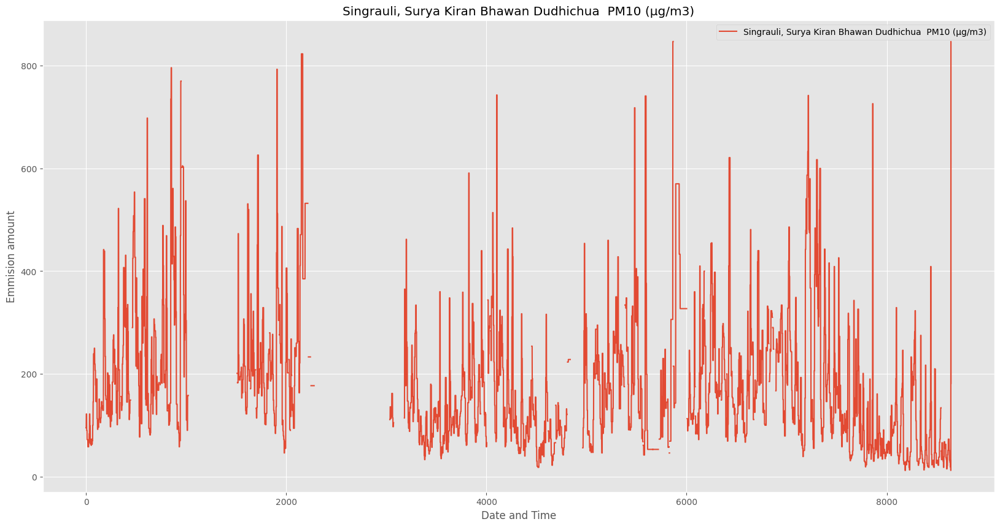

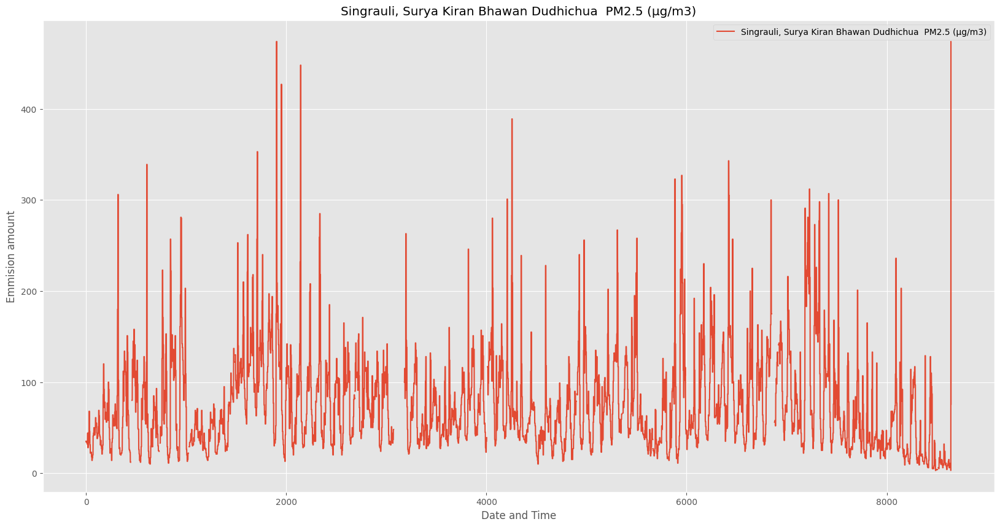

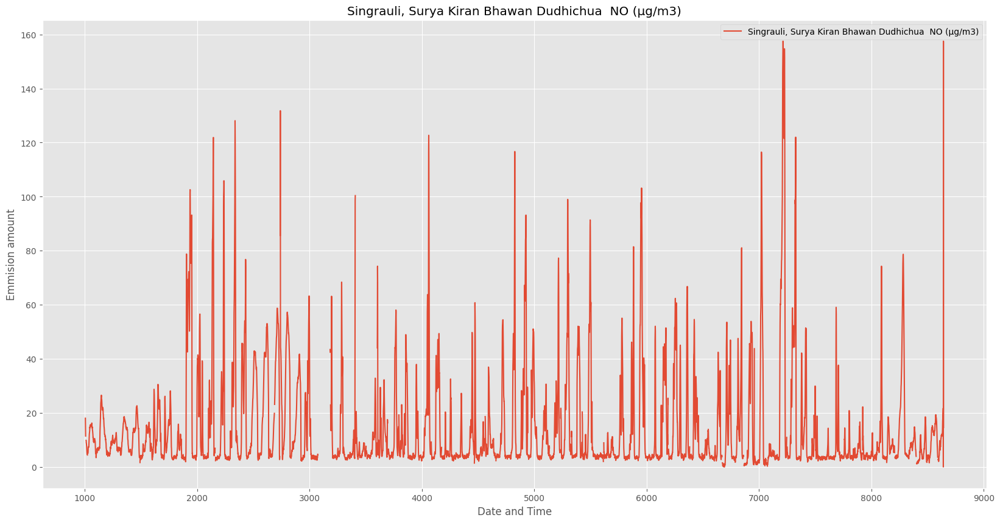

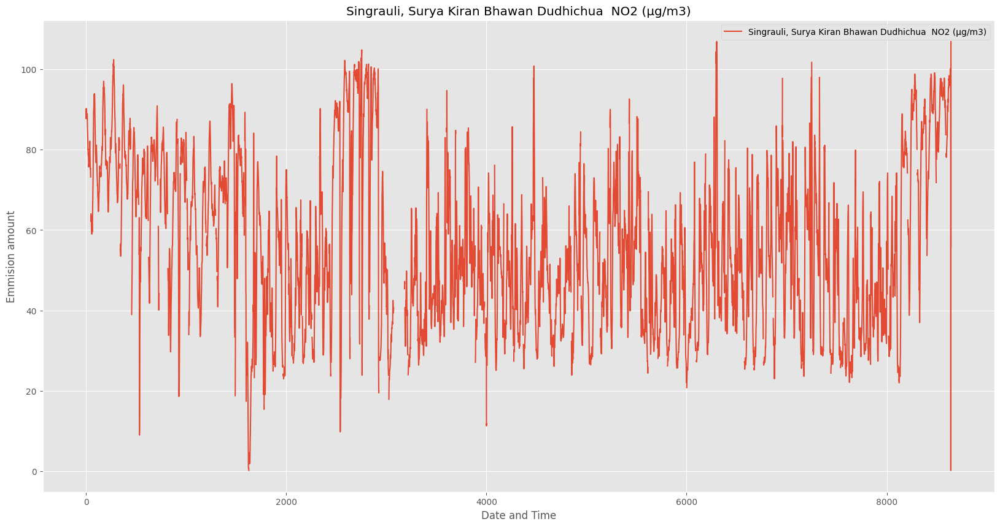

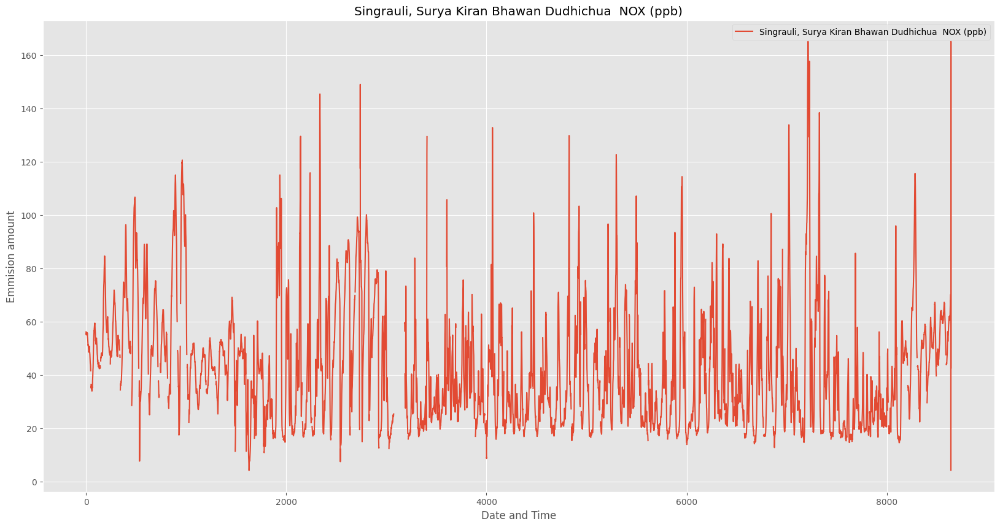

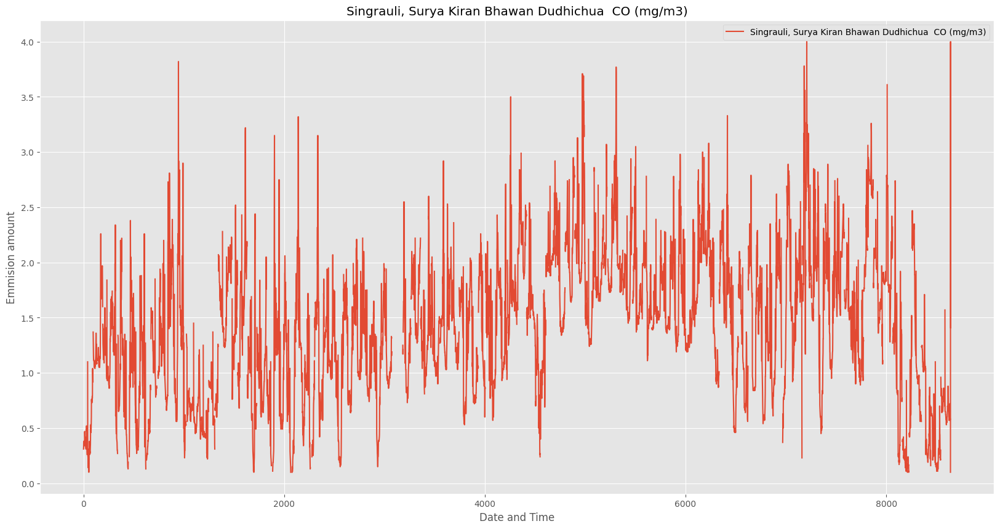

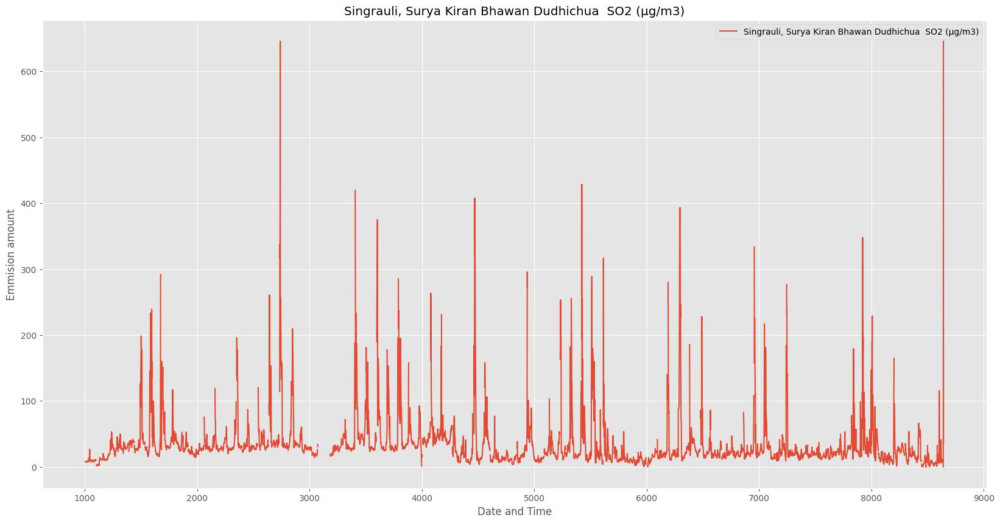

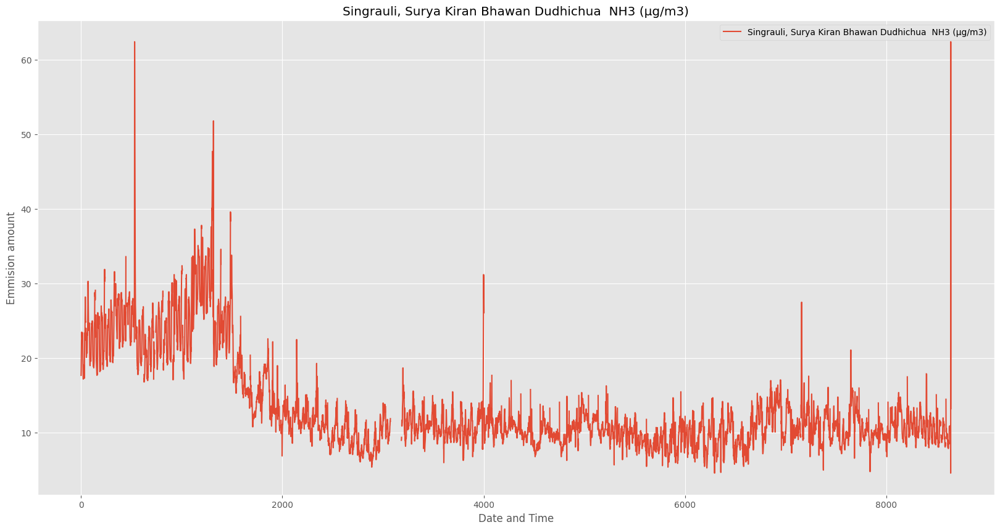

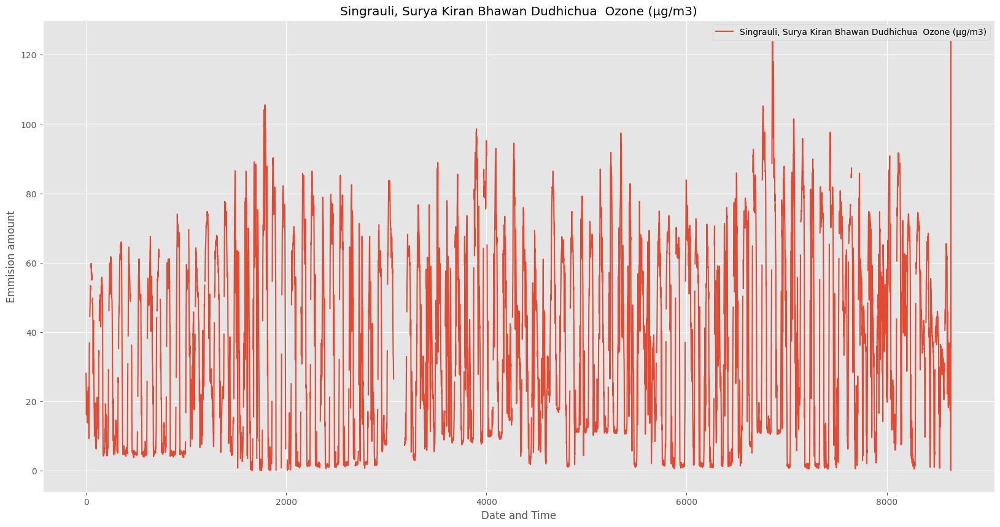

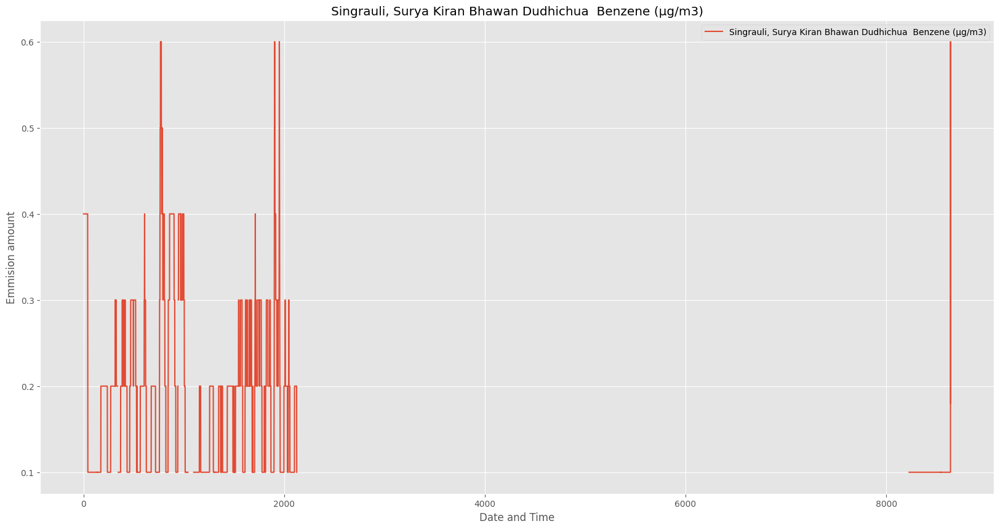

In [ ]:
for column in column_names[3:]:
    plt.style.use('ggplot')
    plt.figure(figsize=(20,10))
    df[column].plot()
    plt.xlabel('Date and Time')
    plt.ylabel('Emmision amount')
    plt.title(column)
    plt.legend()
    plt.show()

In [ ]:
df = df.drop(df.index[-3:])

In [ ]:
for column in column_names[3:]:
  percentage_na = (df[column].isna().sum() / len(df[column])) * 100
  print("Percentage of NaN values in "+column, percentage_na)

Percentage of NaN values in Singrauli, Surya Kiran Bhawan Dudhichua  PM10 (µg/m3) 19.45601851851852
Percentage of NaN values in Singrauli, Surya Kiran Bhawan Dudhichua  PM2.5 (µg/m3) 2.6157407407407405
Percentage of NaN values in Singrauli, Surya Kiran Bhawan Dudhichua  NO (µg/m3) 15.844907407407408
Percentage of NaN values in Singrauli, Surya Kiran Bhawan Dudhichua  NO2 (µg/m3) 4.814814814814815
Percentage of NaN values in Singrauli, Surya Kiran Bhawan Dudhichua  NOX (ppb) 4.8032407407407405
Percentage of NaN values in Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3) 5.7407407407407405
Percentage of NaN values in Singrauli, Surya Kiran Bhawan Dudhichua  SO2 (µg/m3) 16.79398148148148
Percentage of NaN values in Singrauli, Surya Kiran Bhawan Dudhichua  NH3 (µg/m3) 3.7731481481481484
Percentage of NaN values in Singrauli, Surya Kiran Bhawan Dudhichua  Ozone (µg/m3) 5.243055555555555
Percentage of NaN values in Singrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3) 71.70138888888889


In [ ]:
for column in column_names[3:]:
    df[column].fillna(df[column].mean(), inplace=True)

In [ ]:
from statsmodels.tsa.stattools import adfuller

def adfuller_test(column_):
    result=adfuller(column_)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )

    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary")
    else:
        print("weak evidence against null hypothesis,indicating it is non-stationary ")

for column in column_names[3:]:
    adfuller_test(df[column])

ADF Test Statistic : -9.171345660019199
p-value : 2.38370370455468e-15
#Lags Used : 36
Number of Observations : 8603
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary
ADF Test Statistic : -11.367889949056975
p-value : 9.130839033627584e-21
#Lags Used : 36
Number of Observations : 8603
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary
ADF Test Statistic : -14.930705243413781
p-value : 1.3676912706990601e-27
#Lags Used : 33
Number of Observations : 8606
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary
ADF Test Statistic : -9.293483577374921
p-value : 1.1627919469091126e-15
#Lags Used : 22
Number of Observations : 8617
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data is stationary
ADF Test Statistic : -13.666290645984654
p-value : 1.4885340882694023e-25
#Lags Used : 6
Number of Observations : 8633
strong evidence agains

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


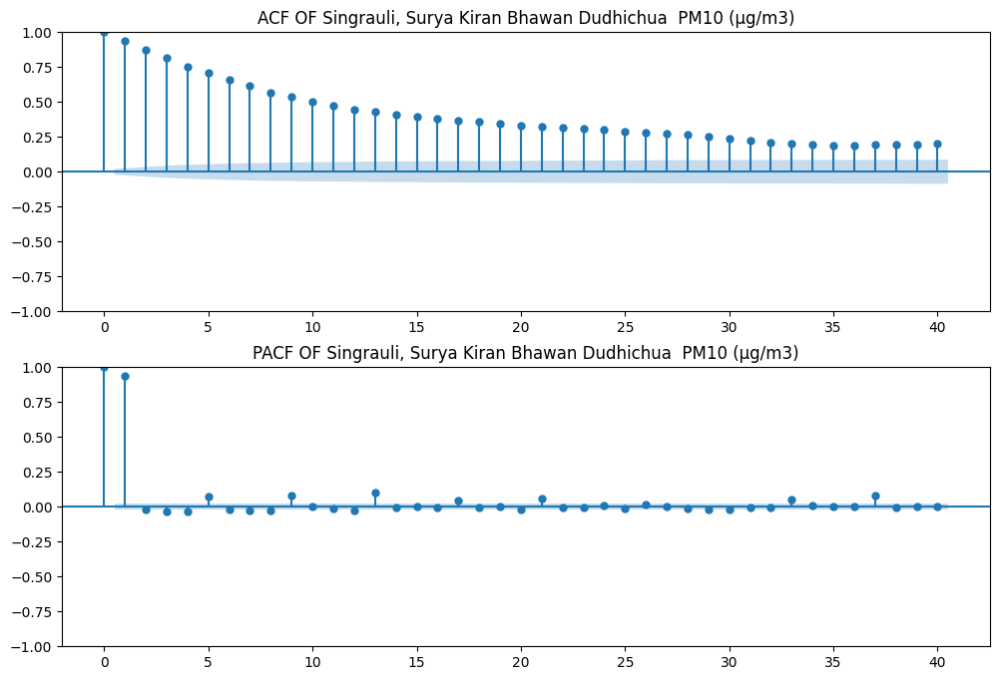

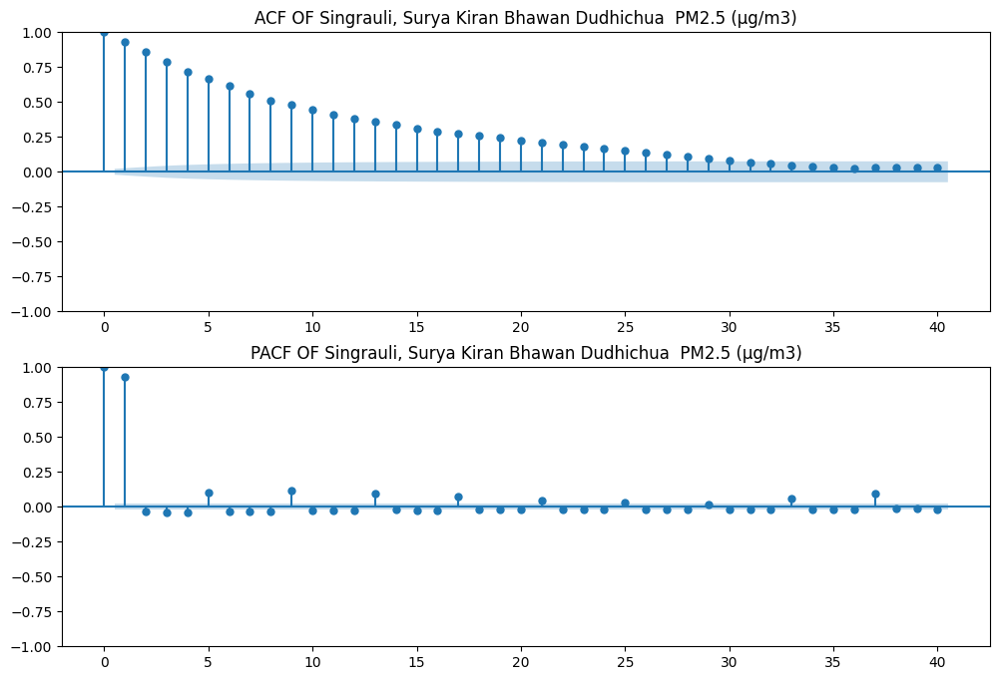

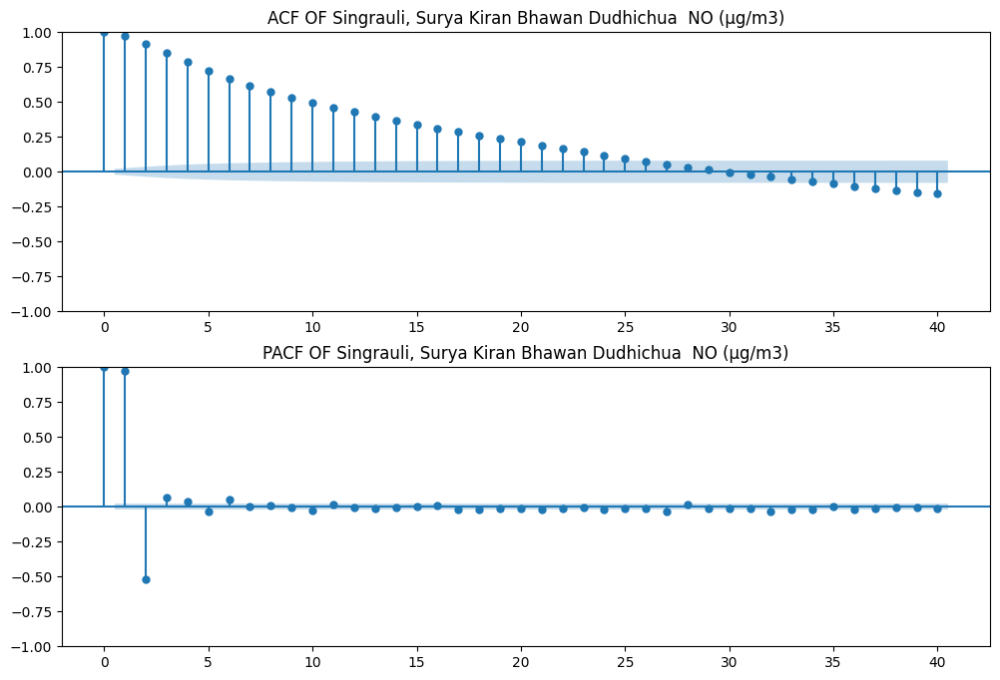

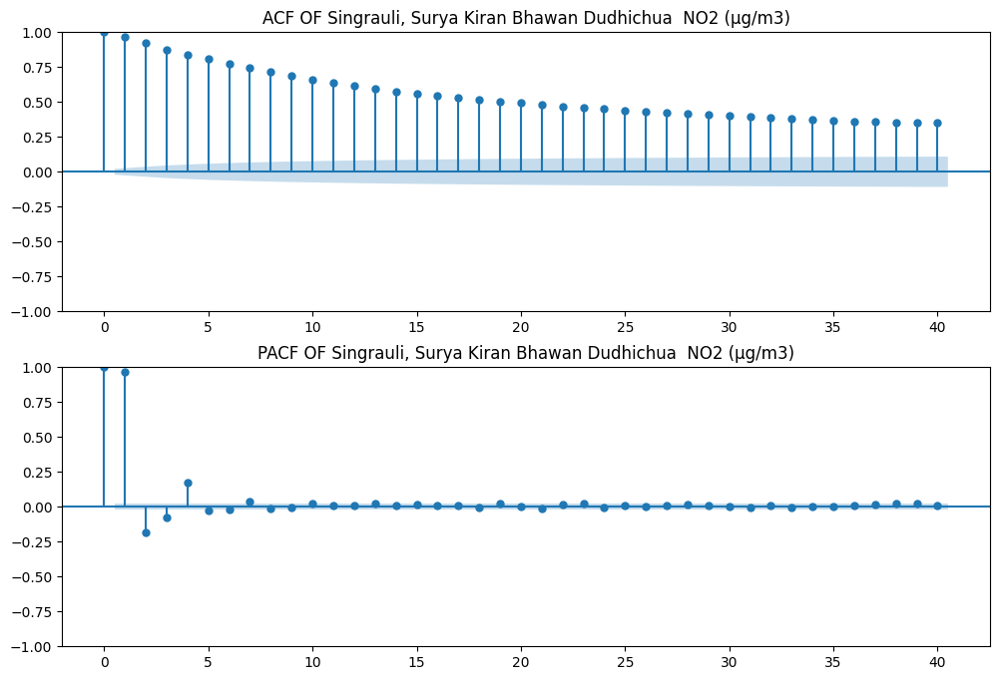

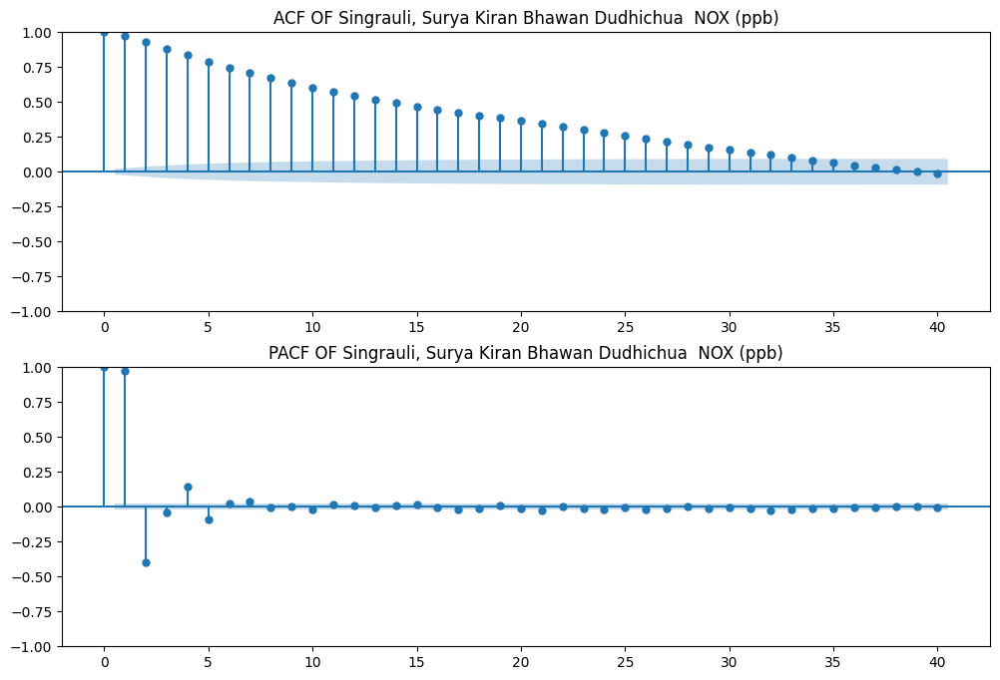

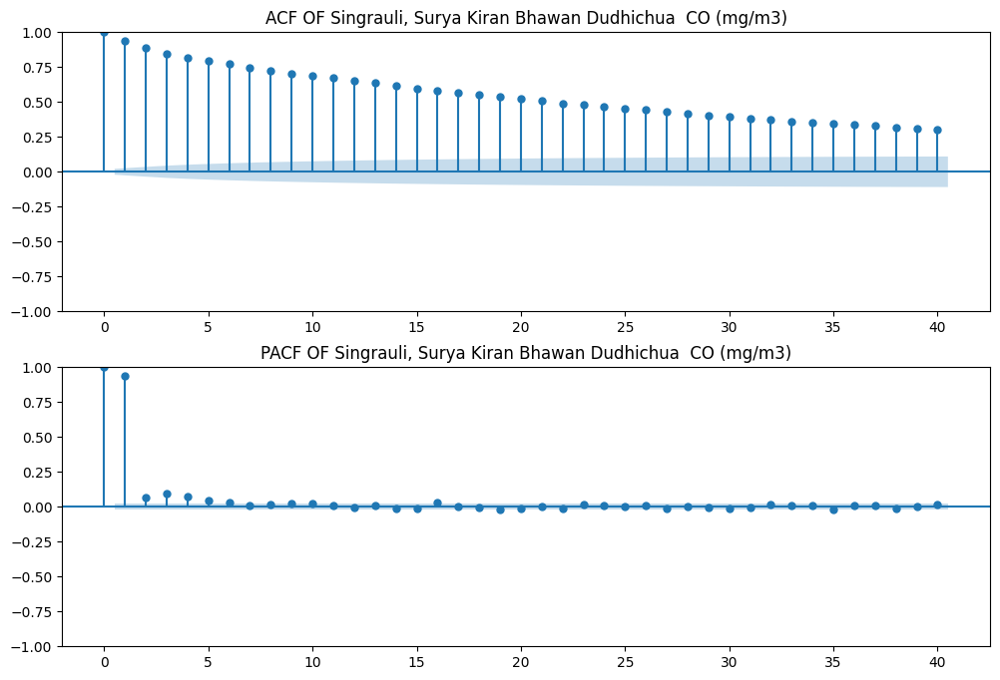

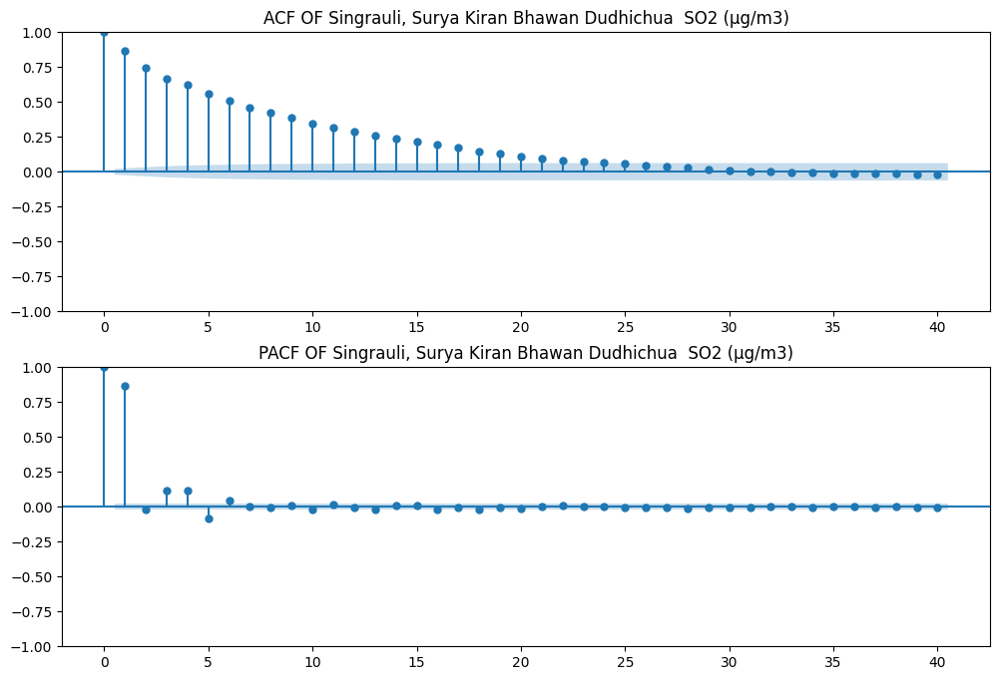

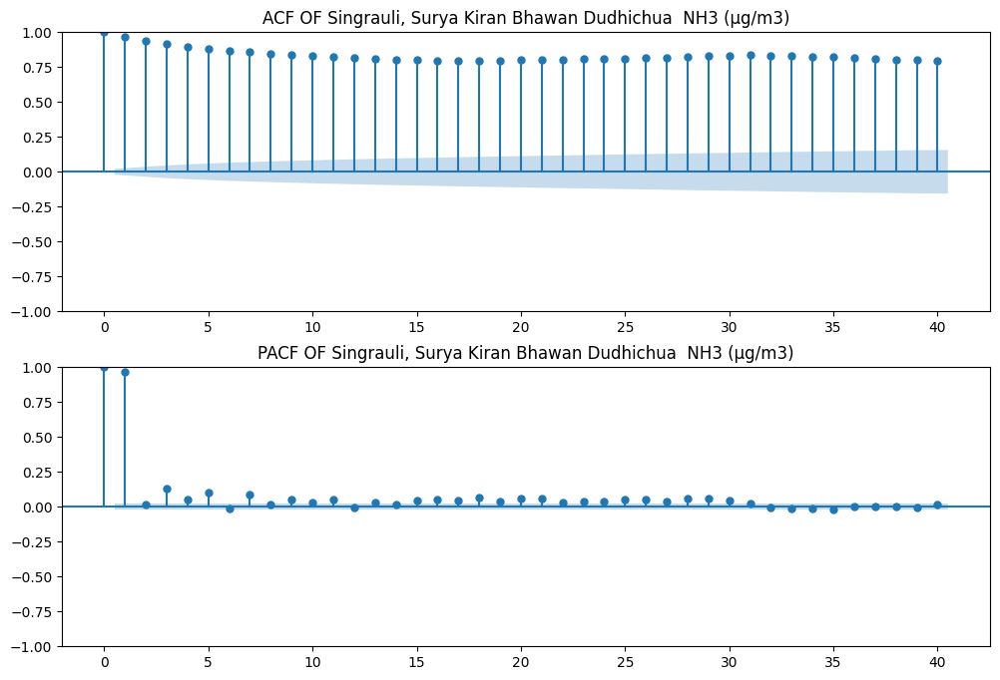

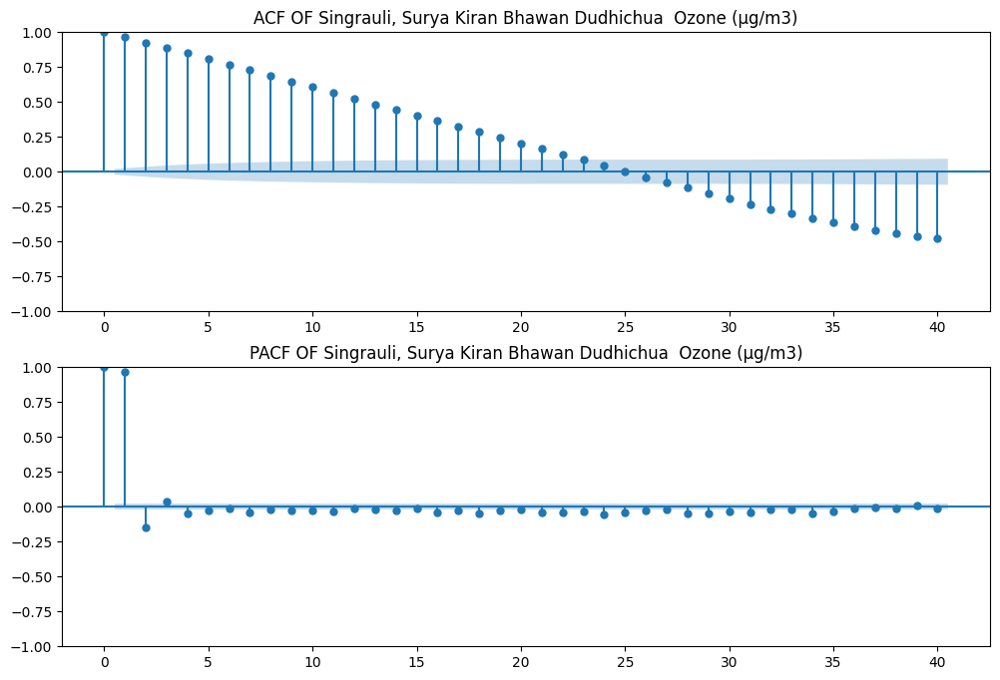

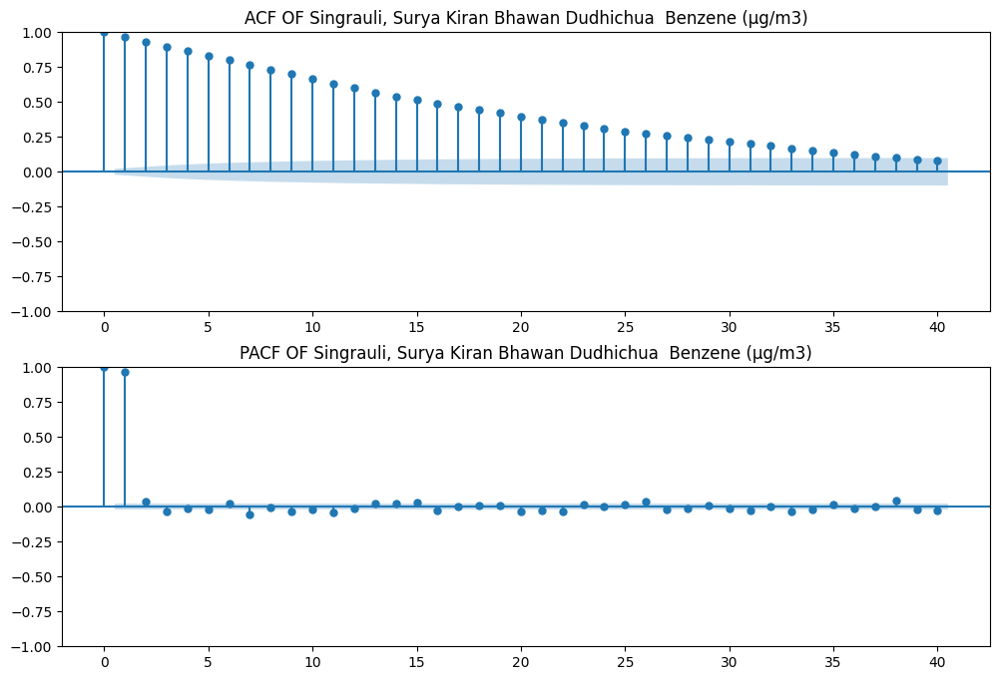

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
i=0
for column in column_names[3:]:
    fig = plt.figure(figsize=(12,8))
    ax1 = fig.add_subplot(211)
    fig = sm.graphics.tsa.plot_acf(df[column].dropna(),lags=40,ax=ax1)
    ax1.set_title('ACF OF '+column)
    ax2 = fig.add_subplot(212)
    fig = sm.graphics.tsa.plot_pacf(df[column].dropna(),lags=40,ax=ax2)
    ax2.set_title('PACF OF '+column)
    i+=1

The ACF plots are exponentially decreasing and PACF plots have only some significant signals close to 1, which suggest that the time series should be modelled using AutoRegressive model.

In [ ]:
lags=[1,1,3,4,4,4,4,5,2,1]

In [ ]:
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error
import math

                                              AutoReg Model Results                                              
Dep. Variable:     Singrauli, Surya Kiran Bhawan Dudhichua  PM10 (µg/m3)   No. Observations:                 8633
Model:                                                        AutoReg(1)   Log Likelihood              -44606.555
Method:                                                  Conditional MLE   S.D. of innovations             42.463
Date:                                                   Wed, 28 Jun 2023   AIC                          89219.110
Time:                                                           03:53:23   BIC                          89240.300
Sample:                                                                1   HQIC                         89226.336
                                                                    8633                                         
                                                               coef    std err          

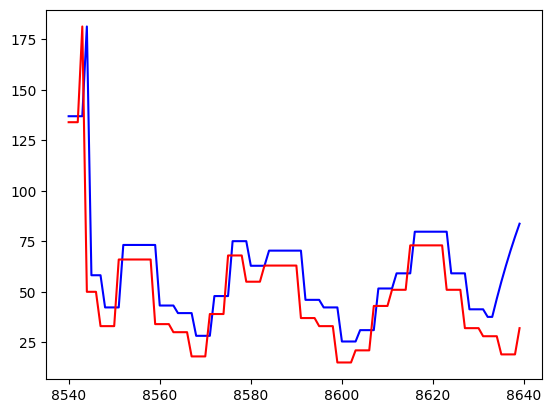

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


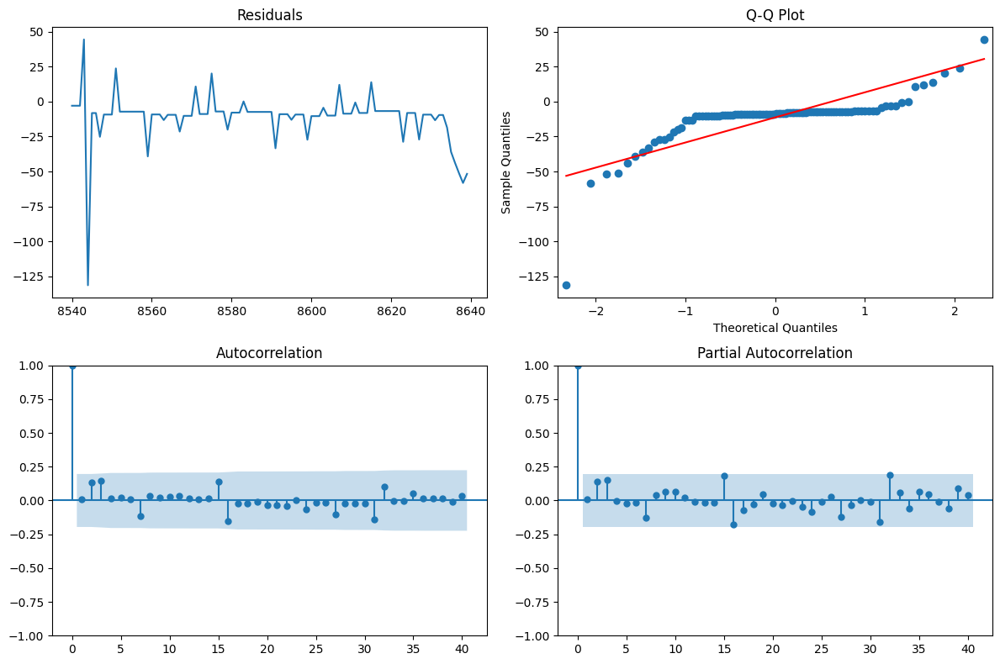

Mean : 181.408679
Root Mean Squared Error : 21.216012
                                              AutoReg Model Results                                               
Dep. Variable:     Singrauli, Surya Kiran Bhawan Dudhichua  PM2.5 (µg/m3)   No. Observations:                 8633
Model:                                                         AutoReg(1)   Log Likelihood              -38191.595
Method:                                                   Conditional MLE   S.D. of innovations             20.196
Date:                                                    Wed, 28 Jun 2023   AIC                          76389.190
Time:                                                            03:53:24   BIC                          76410.380
Sample:                                                                 1   HQIC                         76396.415
                                                                     8633                                         
                          

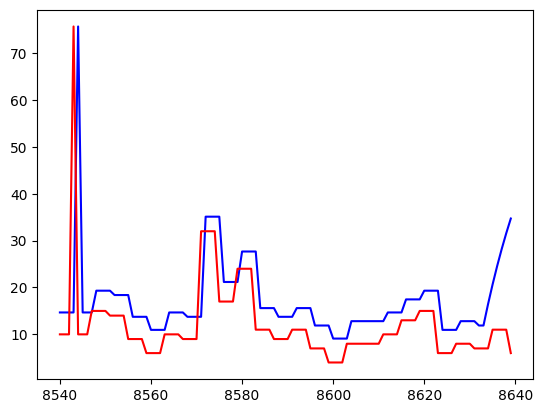

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


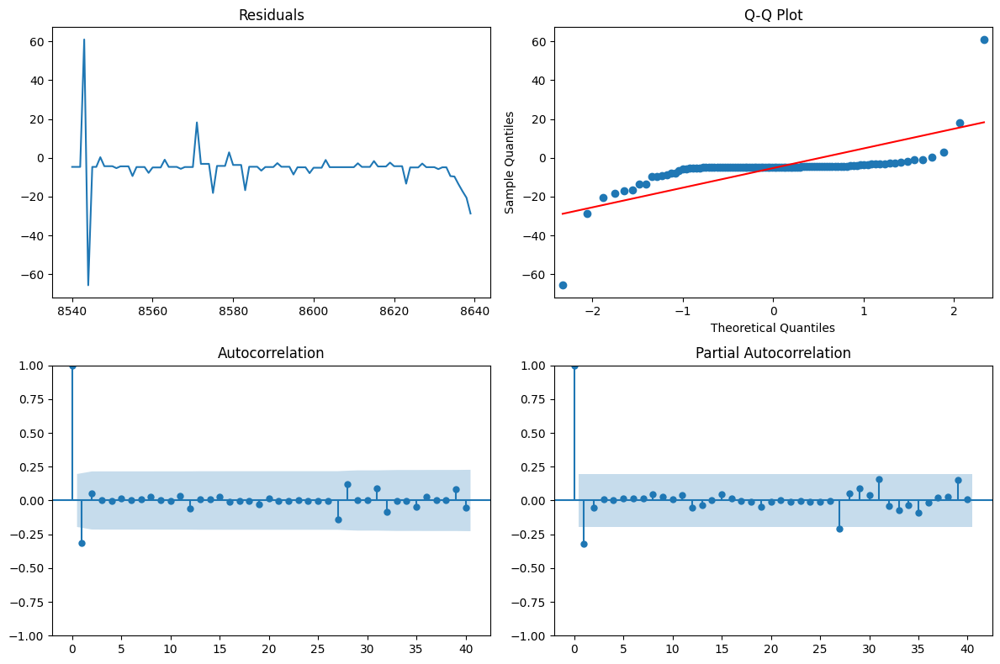

Mean : 75.690397
Root Mean Squared Error : 11.413958
                                             AutoReg Model Results                                             
Dep. Variable:     Singrauli, Surya Kiran Bhawan Dudhichua  NO (µg/m3)   No. Observations:                 8633
Model:                                                      AutoReg(3)   Log Likelihood              -23182.910
Method:                                                Conditional MLE   S.D. of innovations              3.552
Date:                                                 Wed, 28 Jun 2023   AIC                          46375.820
Time:                                                         03:53:25   BIC                          46411.135
Sample:                                                              3   HQIC                         46387.862
                                                                  8633                                         
                                                   

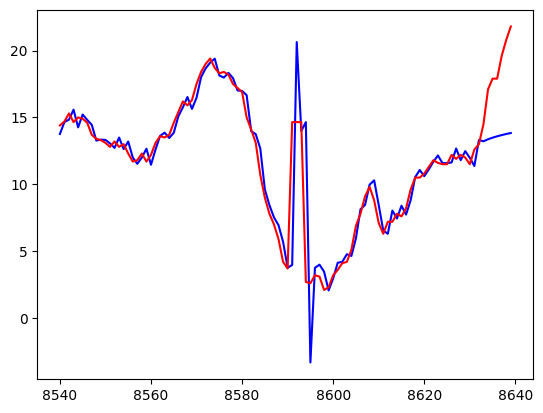

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


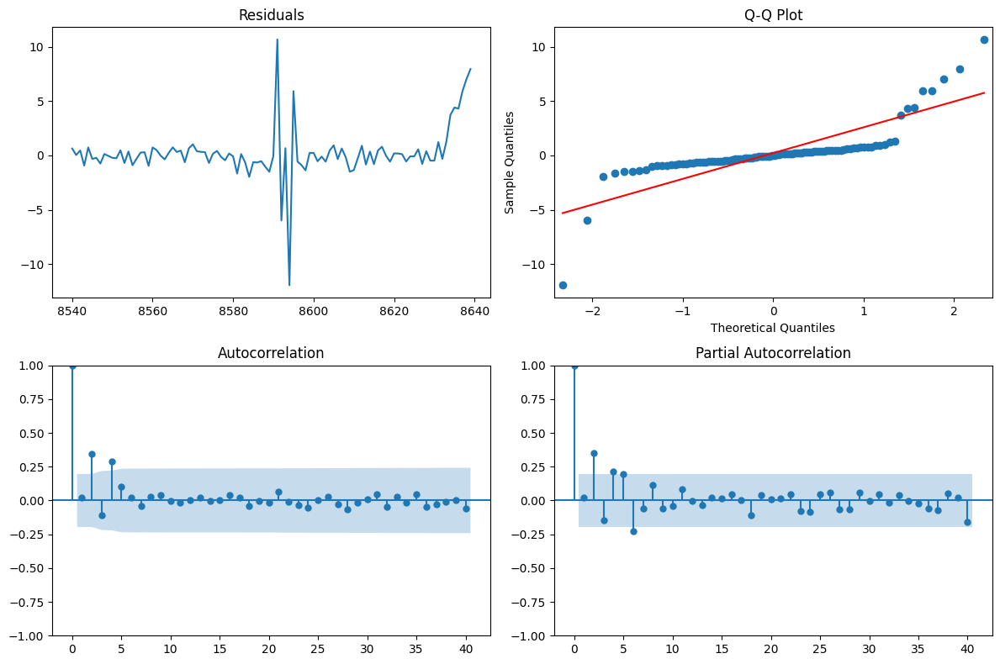

Mean : 14.649636
Root Mean Squared Error : 2.384704
                                             AutoReg Model Results                                              
Dep. Variable:     Singrauli, Surya Kiran Bhawan Dudhichua  NO2 (µg/m3)   No. Observations:                 8633
Model:                                                       AutoReg(4)   Log Likelihood              -25758.236
Method:                                                 Conditional MLE   S.D. of innovations              4.788
Date:                                                  Wed, 28 Jun 2023   AIC                          51528.472
Time:                                                          03:53:26   BIC                          51570.849
Sample:                                                               4   HQIC                         51542.922
                                                                   8633                                         
                                            

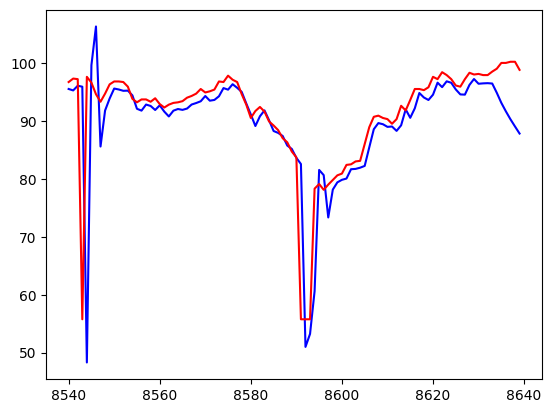

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


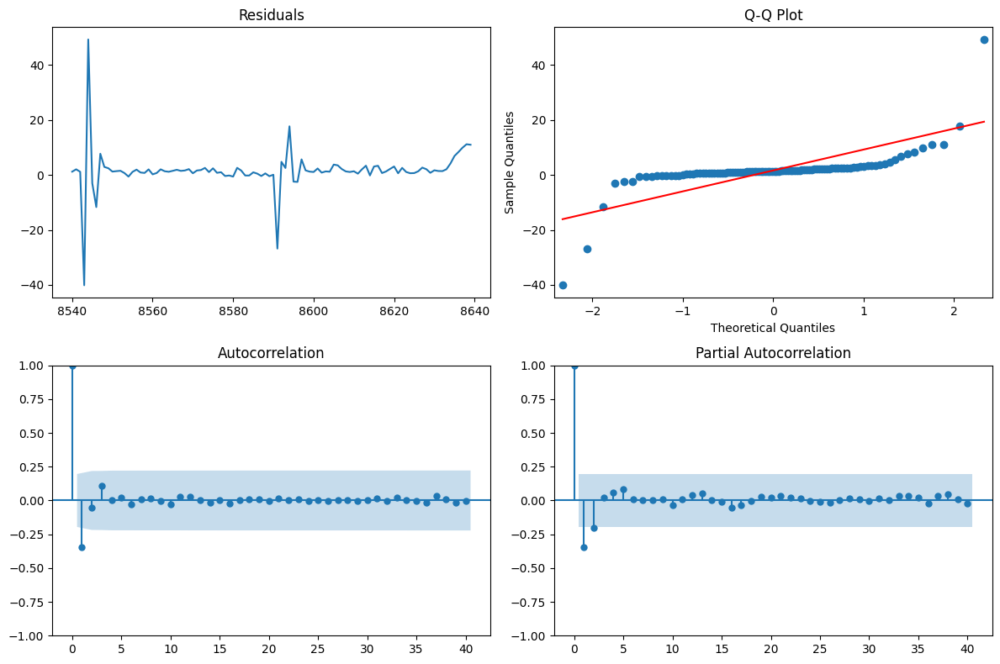

Mean : 55.757028
Root Mean Squared Error : 7.785124
                                            AutoReg Model Results                                             
Dep. Variable:     Singrauli, Surya Kiran Bhawan Dudhichua  NOX (ppb)   No. Observations:                 8633
Model:                                                     AutoReg(4)   Log Likelihood              -24968.146
Method:                                               Conditional MLE   S.D. of innovations              4.369
Date:                                                Wed, 28 Jun 2023   AIC                          49948.292
Time:                                                        03:53:27   BIC                          49990.669
Sample:                                                             4   HQIC                         49962.742
                                                                 8633                                         
                                                            

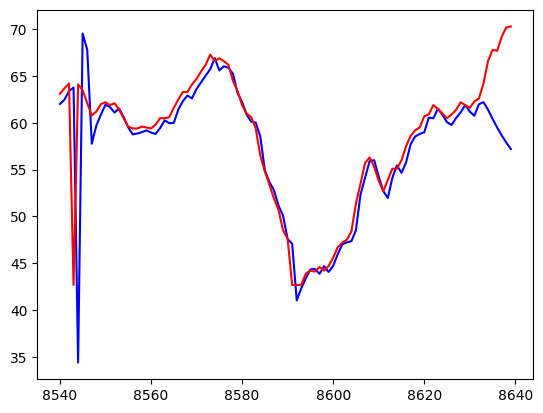

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


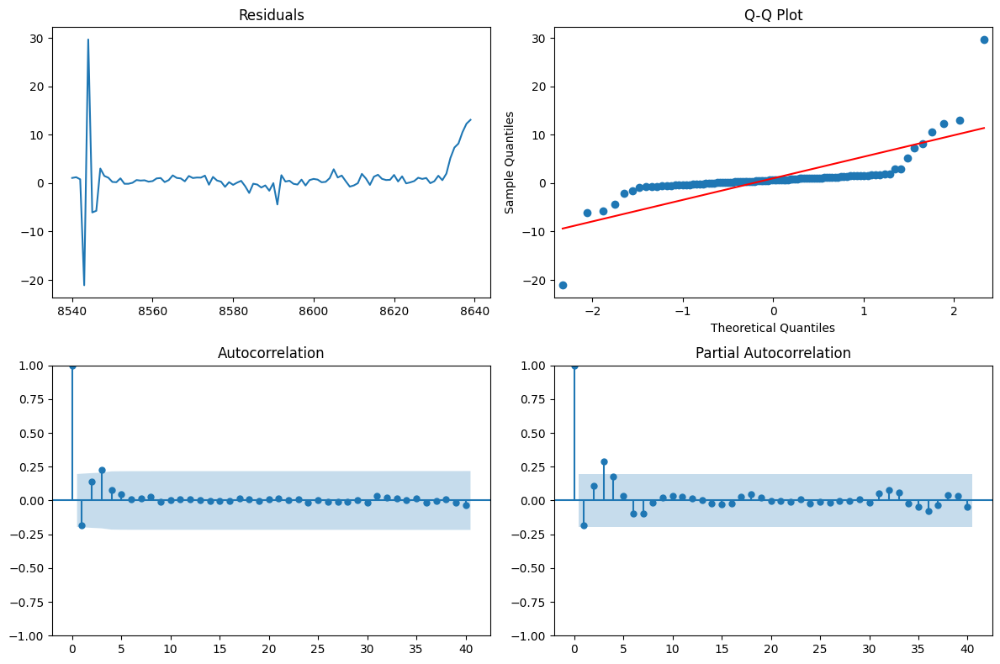

Mean : 42.672219
Root Mean Squared Error : 4.573200
                                             AutoReg Model Results                                             
Dep. Variable:     Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3)   No. Observations:                 8633
Model:                                                      AutoReg(4)   Log Likelihood                1128.954
Method:                                                Conditional MLE   S.D. of innovations              0.212
Date:                                                 Wed, 28 Jun 2023   AIC                          -2245.908
Time:                                                         03:53:28   BIC                          -2203.531
Sample:                                                              4   HQIC                         -2231.458
                                                                  8633                                         
                                                    

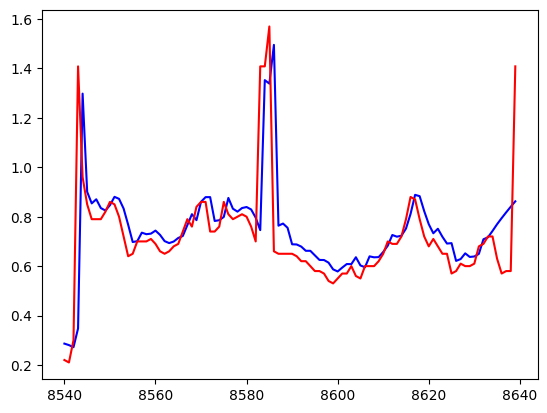

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


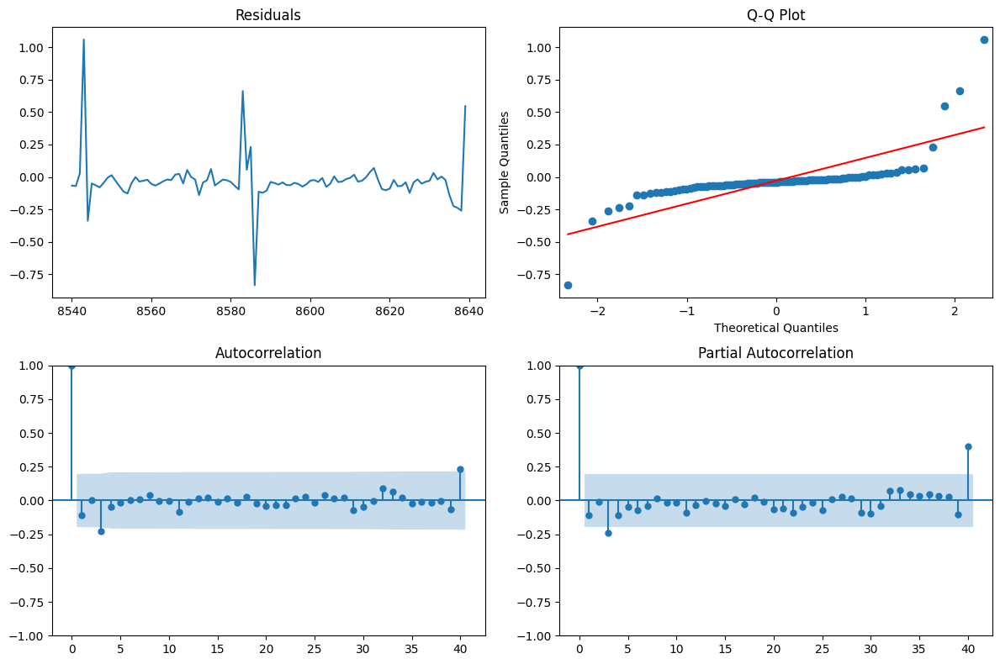

Mean : 1.408538
Root Mean Squared Error : 0.179310
                                             AutoReg Model Results                                              
Dep. Variable:     Singrauli, Surya Kiran Bhawan Dudhichua  SO2 (µg/m3)   No. Observations:                 8633
Model:                                                       AutoReg(4)   Log Likelihood              -37138.232
Method:                                                 Conditional MLE   S.D. of innovations             17.903
Date:                                                  Wed, 28 Jun 2023   AIC                          74288.463
Time:                                                          03:53:29   BIC                          74330.841
Sample:                                                               4   HQIC                         74302.914
                                                                   8633                                         
                                             

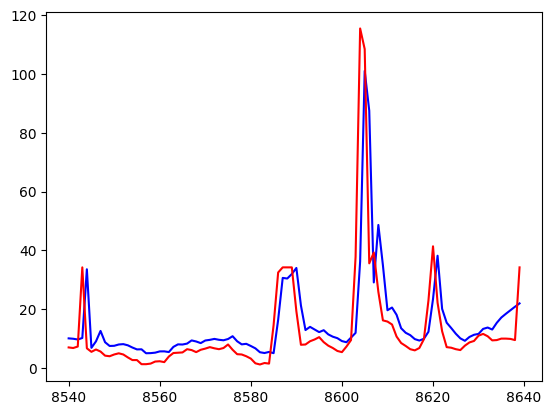

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


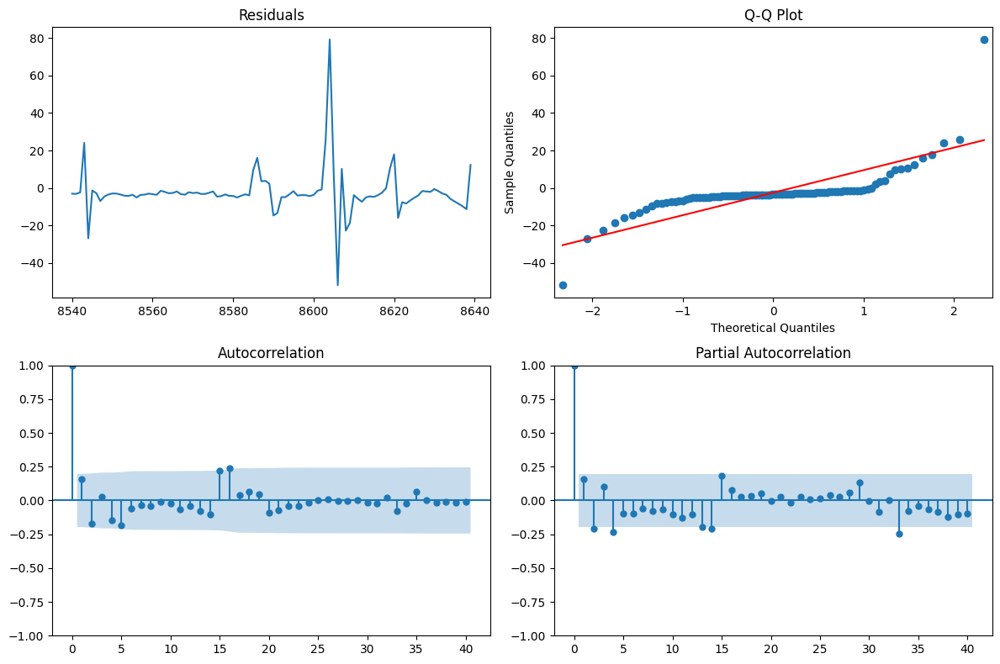

Mean : 34.232731
Root Mean Squared Error : 12.287634
                                             AutoReg Model Results                                              
Dep. Variable:     Singrauli, Surya Kiran Bhawan Dudhichua  NH3 (µg/m3)   No. Observations:                 8633
Model:                                                       AutoReg(5)   Log Likelihood              -15891.903
Method:                                                 Conditional MLE   S.D. of innovations              1.526
Date:                                                  Wed, 28 Jun 2023   AIC                          31797.807
Time:                                                          03:53:31   BIC                          31847.246
Sample:                                                               5   HQIC                         31814.665
                                                                   8633                                         
                                           

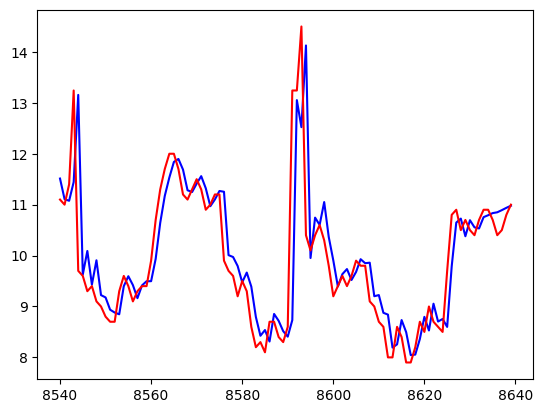

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


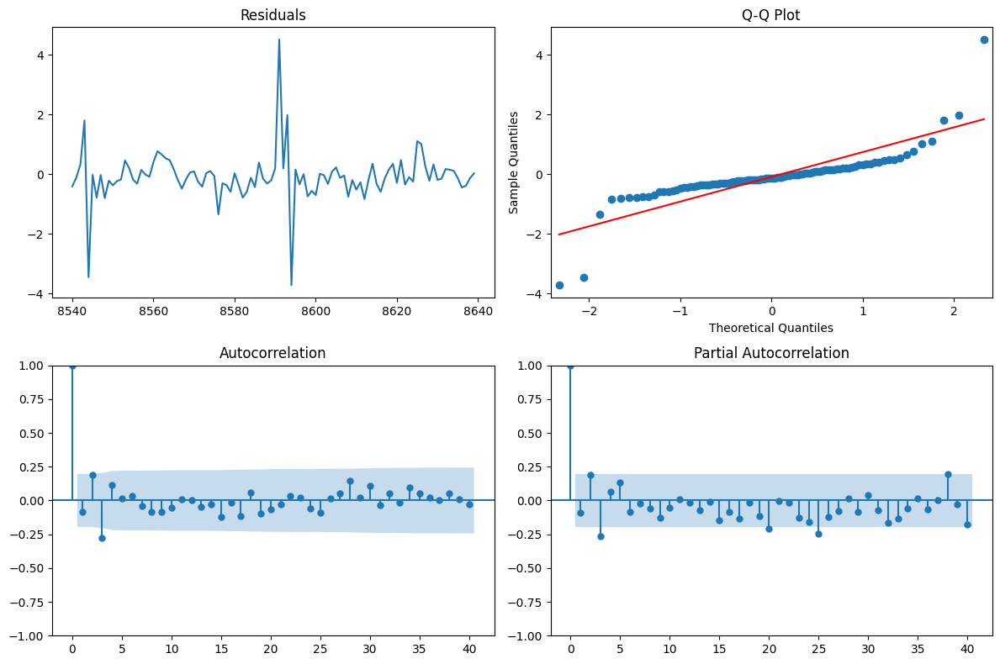

Mean : 13.242663
Root Mean Squared Error : 0.834479
                                              AutoReg Model Results                                               
Dep. Variable:     Singrauli, Surya Kiran Bhawan Dudhichua  Ozone (µg/m3)   No. Observations:                 8633
Model:                                                         AutoReg(2)   Log Likelihood              -28551.008
Method:                                                   Conditional MLE   S.D. of innovations              6.613
Date:                                                    Wed, 28 Jun 2023   AIC                          57110.017
Time:                                                            03:53:32   BIC                          57138.269
Sample:                                                                 2   HQIC                         57119.651
                                                                     8633                                         
                            

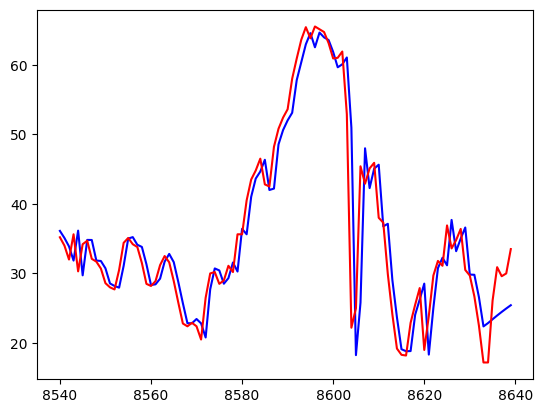

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


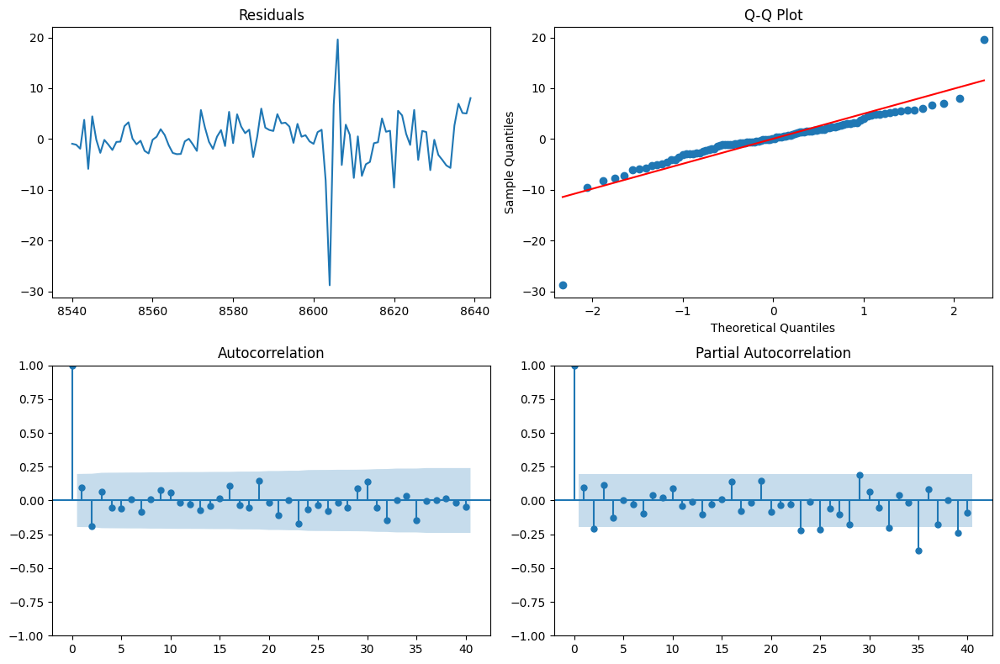

Mean : 35.626530
Root Mean Squared Error : 4.923704
                                               AutoReg Model Results                                                
Dep. Variable:     Singrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3)   No. Observations:                 8633
Model:                                                           AutoReg(1)   Log Likelihood               24679.686
Method:                                                     Conditional MLE   S.D. of innovations              0.014
Date:                                                      Wed, 28 Jun 2023   AIC                         -49353.371
Time:                                                              03:53:33   BIC                         -49332.182
Sample:                                                                   1   HQIC                        -49346.146
                                                                       8633                                         
            

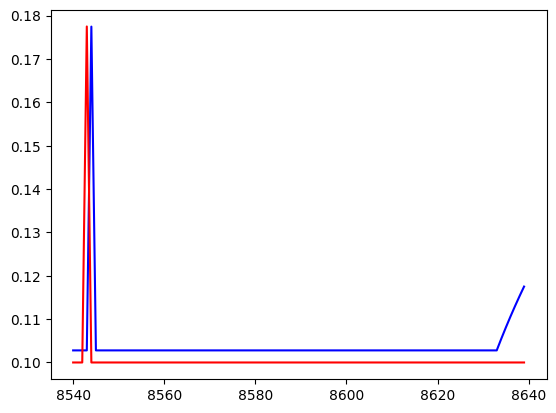

/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


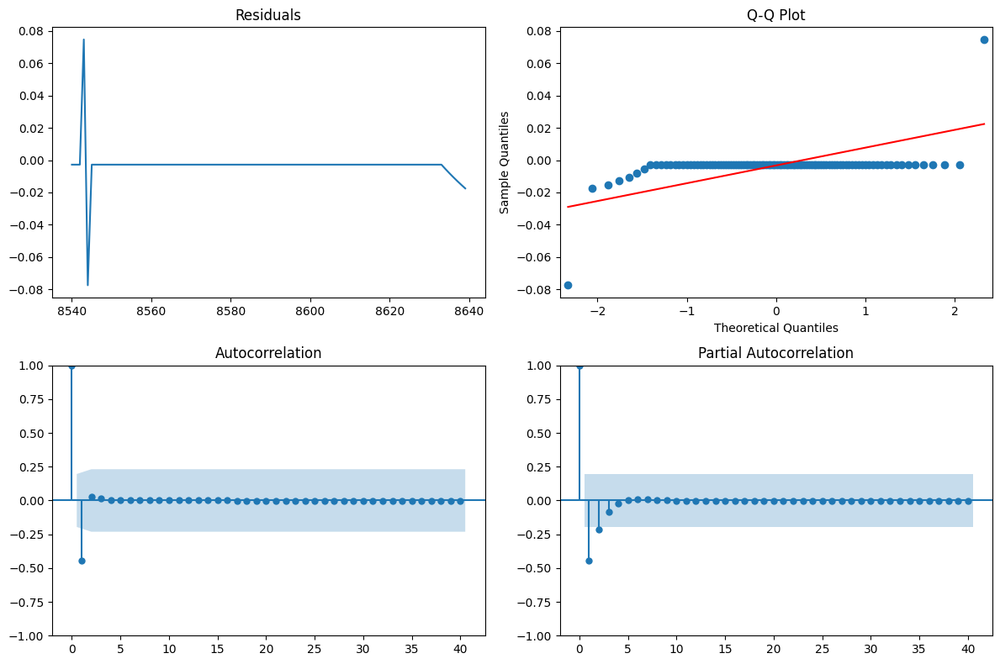

Mean : 0.177505
Root Mean Squared Error : 0.011495


In [ ]:
i=0
for column in column_names[3:]:
    train_data=df[column][:-100]
    test_data=df[column][-100:]
    ar_model=AutoReg(df[column][:-7], lags=lags[i]).fit()
    print(ar_model.summary())
    pred = ar_model.predict(start = len(train_data), end = len(df) - 1, dynamic=False)
    plt.plot(pred, color = "blue")
    plt.plot(test_data, color = "red")
    plt.show()
    ar_residuals=test_data-pred
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    axes[0, 0].plot(ar_residuals)
    axes[0, 0].set_title('Residuals')
    sm.qqplot(ar_residuals, line='s', ax=axes[0, 1])
    axes[0, 1].set_title('Q-Q Plot')
    sm.graphics.tsa.plot_acf(ar_residuals, lags=40, ax=axes[1, 0])
    axes[1, 0].set_title('Autocorrelation')
    sm.graphics.tsa.plot_pacf(ar_residuals, lags=40, ax=axes[1, 1])
    axes[1, 1].set_title('Partial Autocorrelation')
    plt.tight_layout()
    plt.show()
    rmse = math.sqrt(mean_squared_error(pred, test_data))
    mean = df[column].mean()
    print("Mean : %f" % mean)
    print("Root Mean Squared Error : %f" %rmse)
    i+=1

The QQ plot does not follow the straight line, which leads to the conclusion that the distribution plots deviate from normality. This can be verified by plotting the various distribution plots.

<ipython-input-14-f0a8e43f7859>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column])


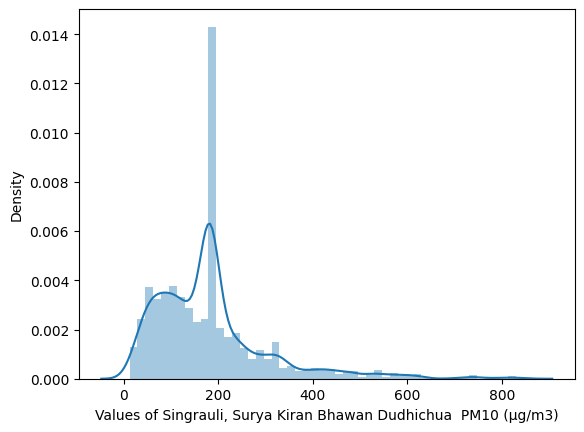

<ipython-input-14-f0a8e43f7859>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column])


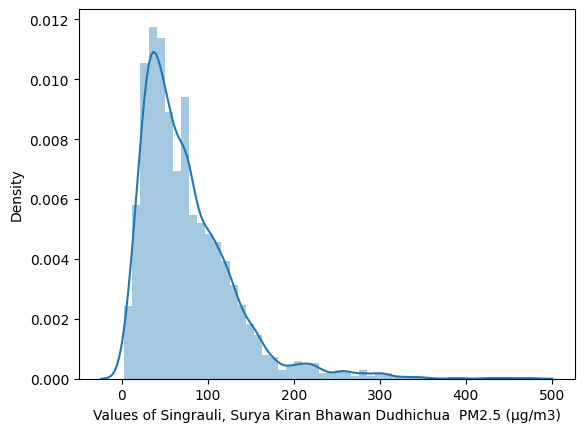

<ipython-input-14-f0a8e43f7859>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column])


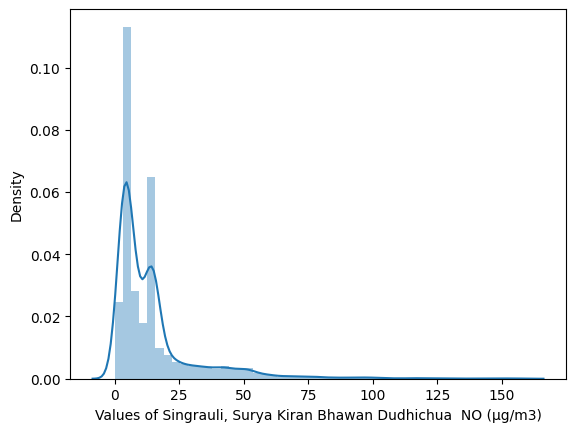

<ipython-input-14-f0a8e43f7859>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column])


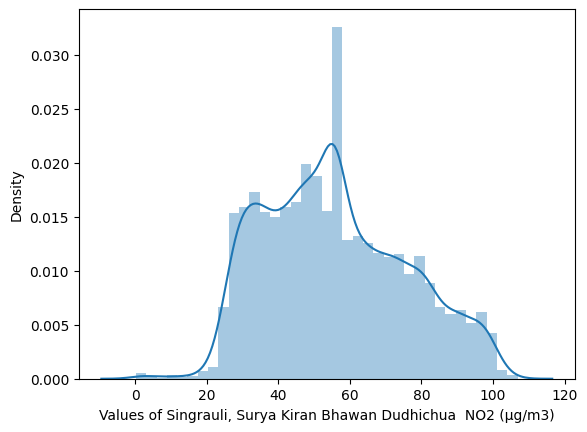

<ipython-input-14-f0a8e43f7859>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column])


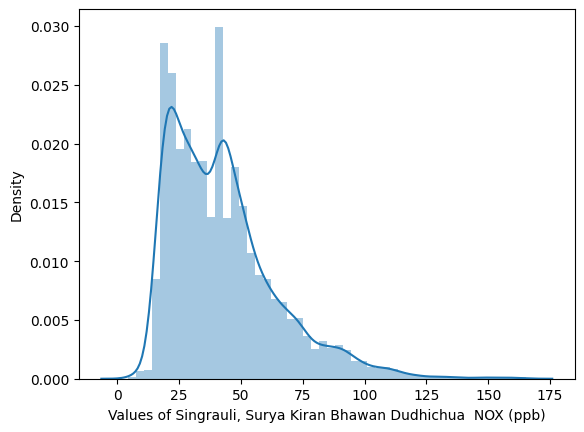

<ipython-input-14-f0a8e43f7859>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column])


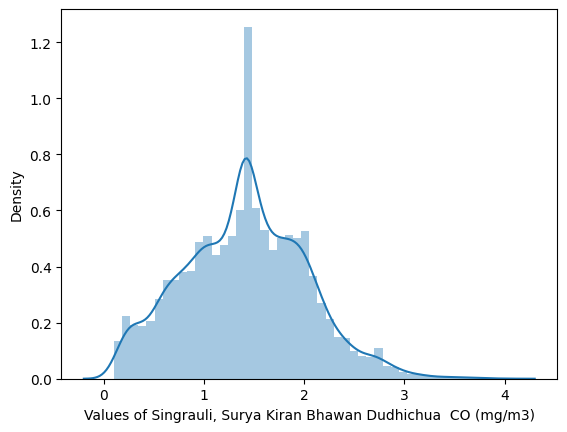

<ipython-input-14-f0a8e43f7859>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column])


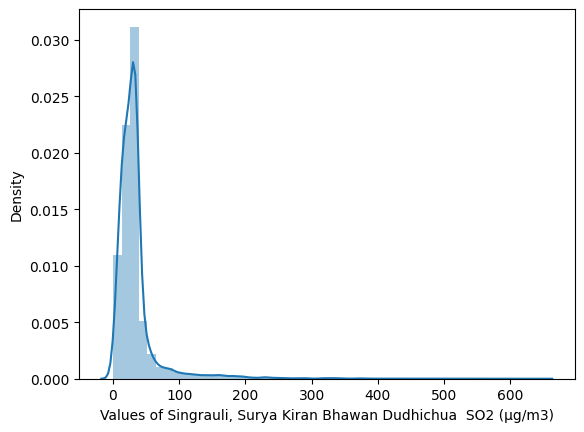

<ipython-input-14-f0a8e43f7859>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column])


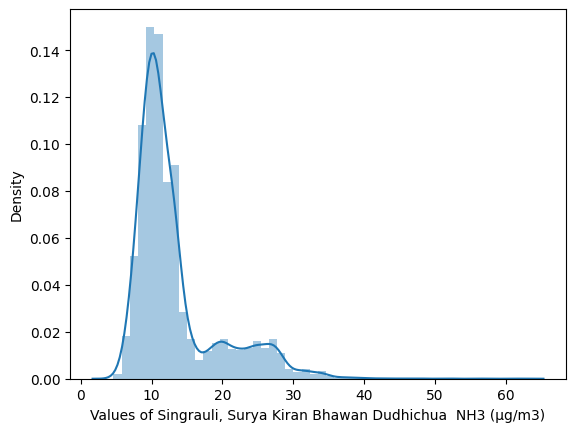

<ipython-input-14-f0a8e43f7859>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column])


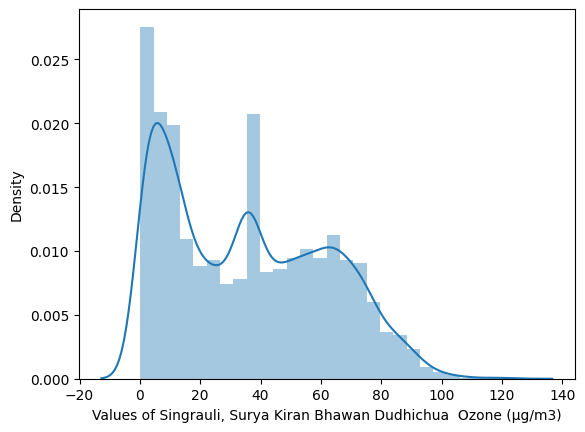

<ipython-input-14-f0a8e43f7859>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[column])


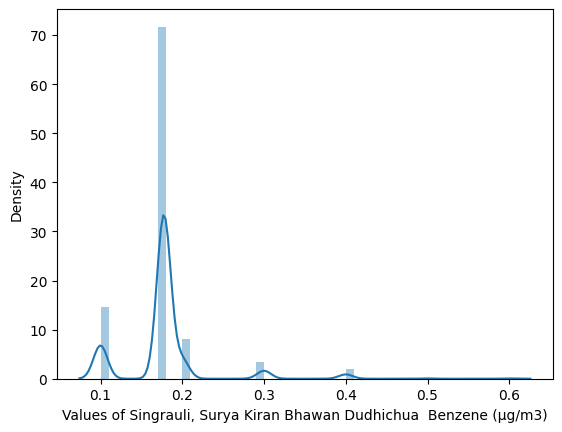

In [ ]:
for column in column_names[3:]:
  sns.distplot(df[column])
  plt.xlabel('Values of '+column)
  plt.ylabel('Density')
  plt.show()

In [ ]:
df1=pd.read_csv('EE798Q.csv')

In [ ]:
column_names1=df1.columns

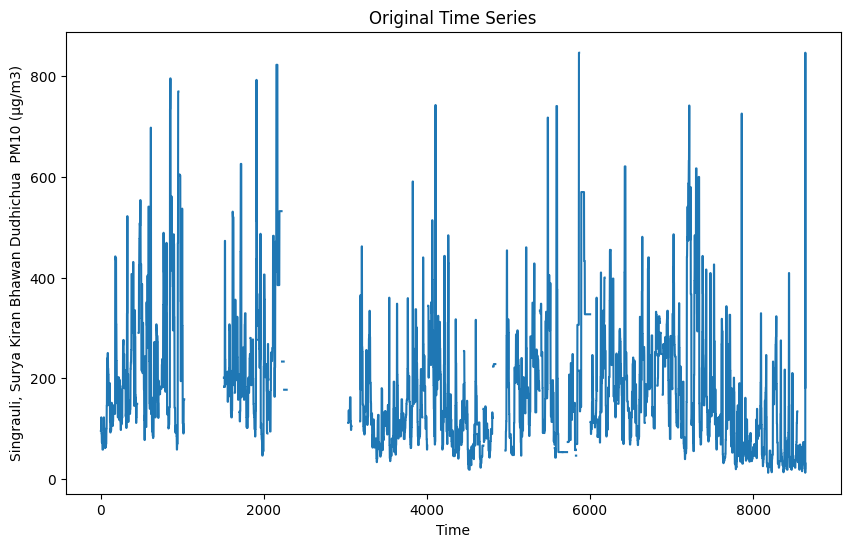

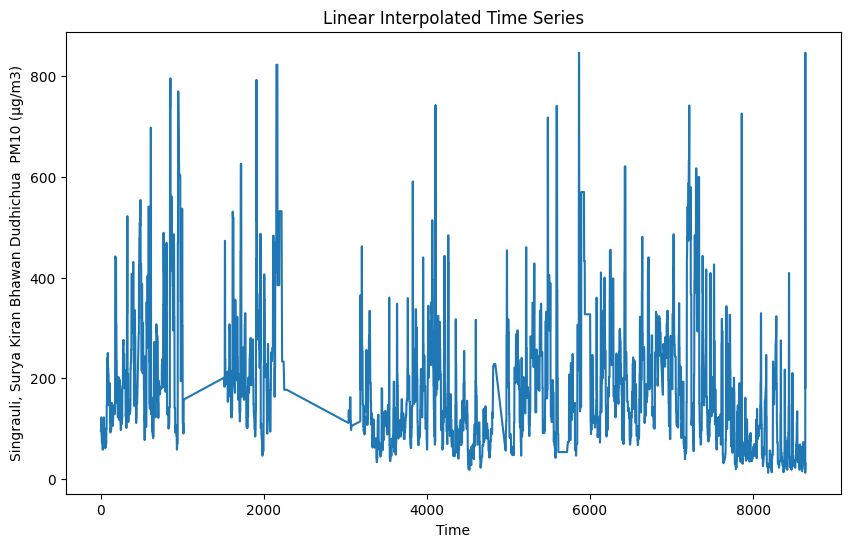

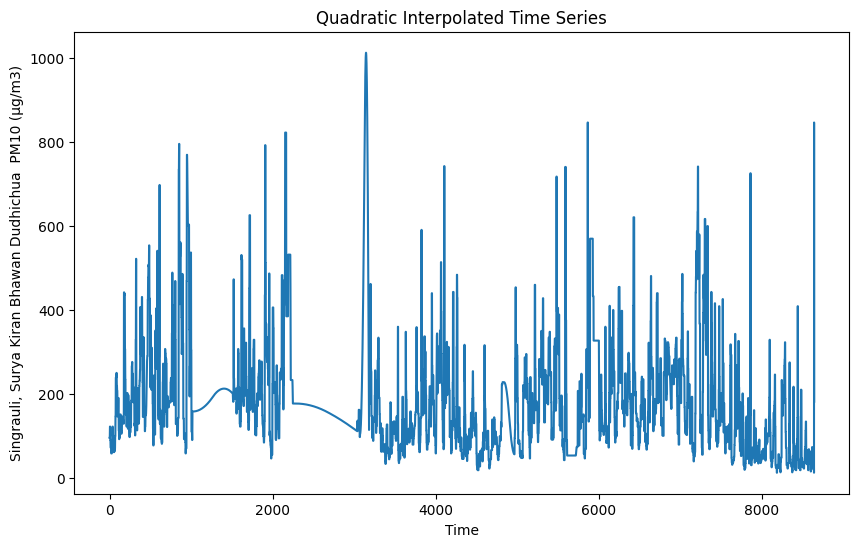

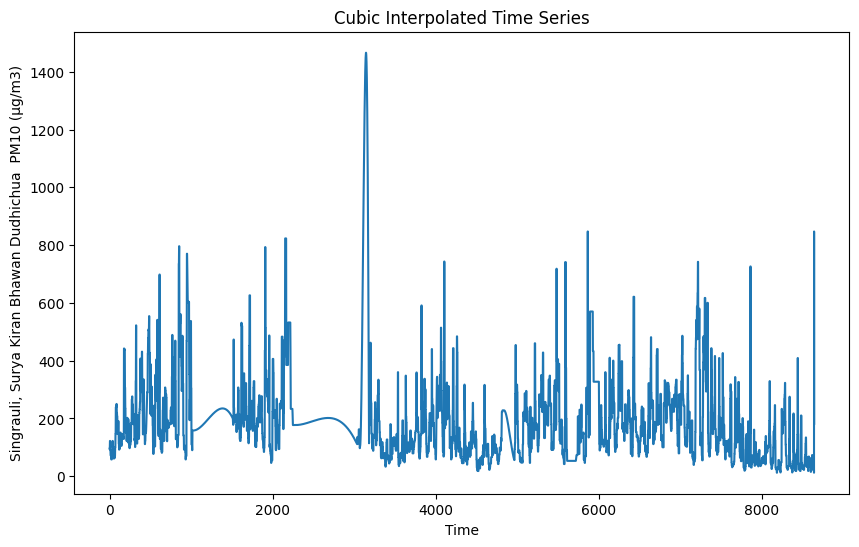

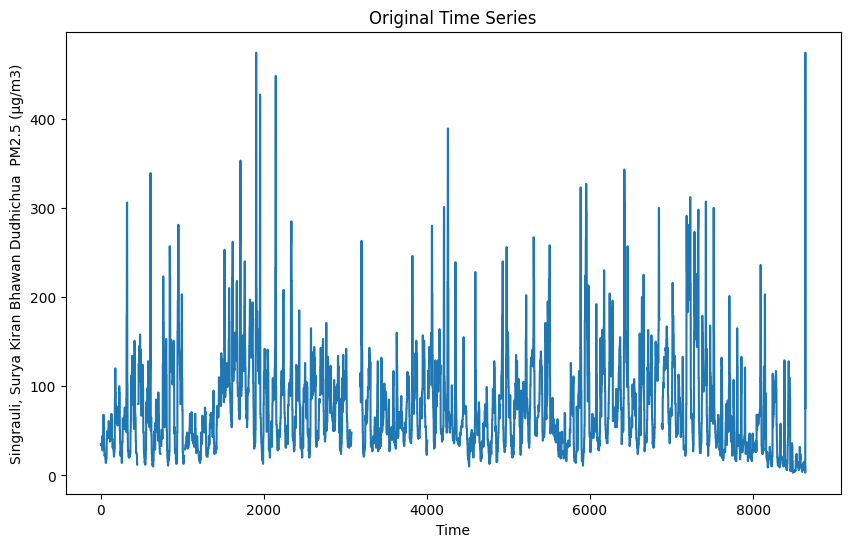

...

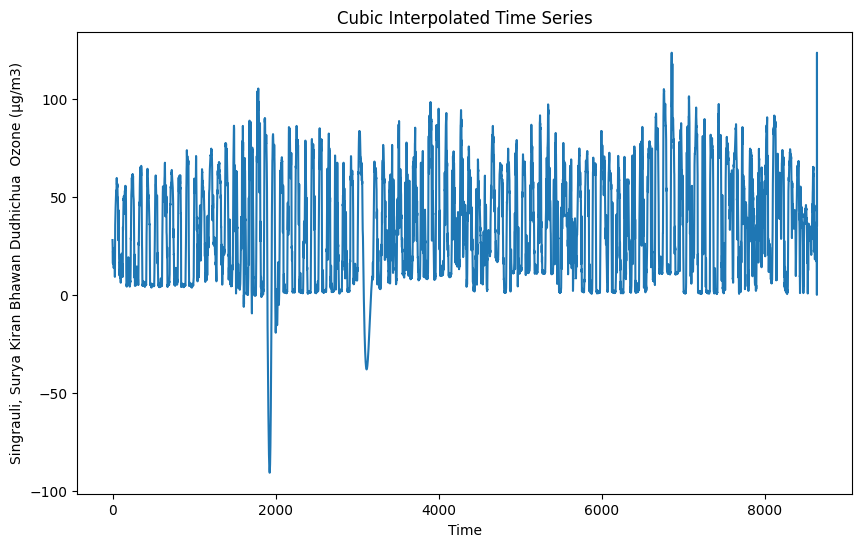

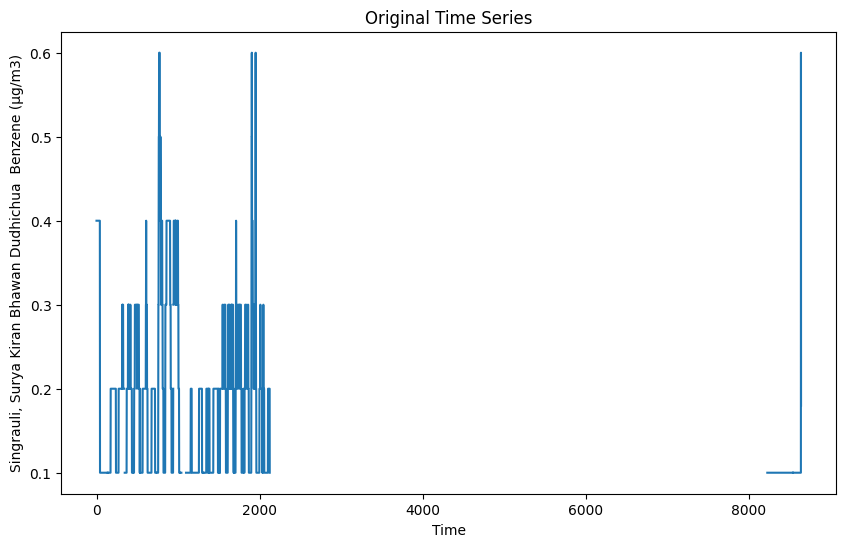

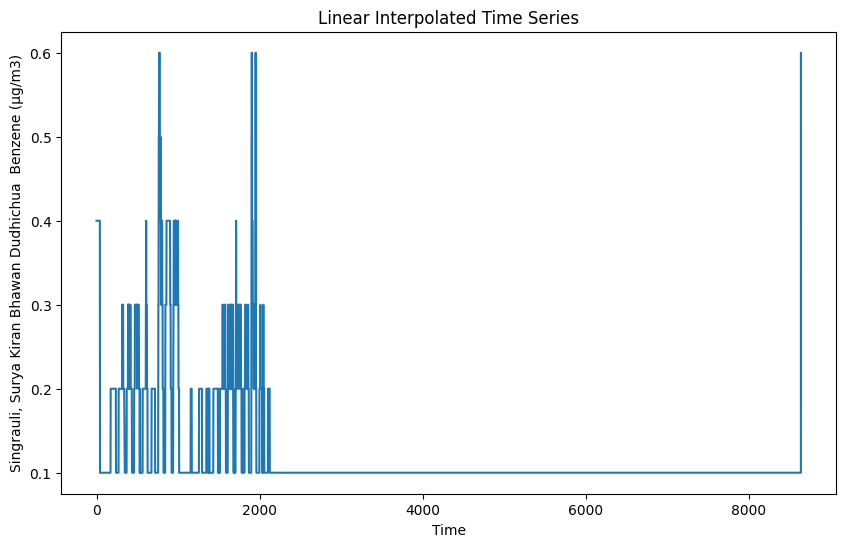

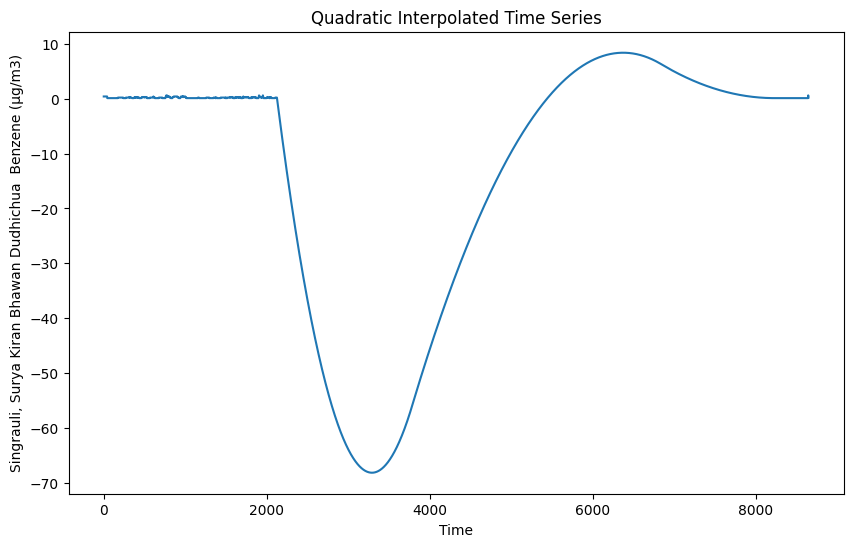

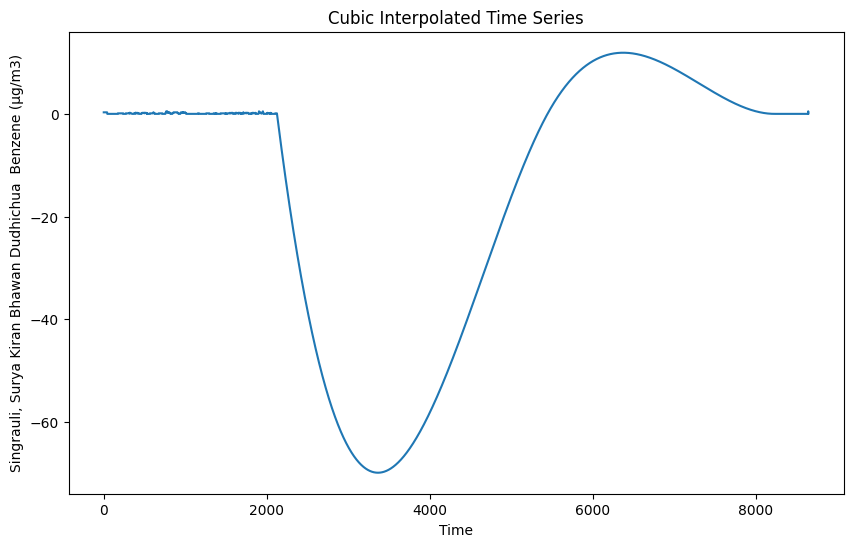

In [ ]:
for column in column_names1[3:]:
  df1[column]=pd.Series(df1[column])

  linear_interpolated=df1[column].interpolate(method='linear')
  quadratic_interpolated=df1[column].interpolate(method='quadratic')
  cubic_interpolated=df1[column].interpolate(method='cubic')

  plt.figure(figsize=(10, 6))
  plt.plot(df1[column], label='Original')
  plt.xlabel('Time')
  plt.ylabel(column)
  plt.title('Original Time Series')
  plt.show()

  plt.figure(figsize=(10, 6))
  plt.plot(linear_interpolated, label='Linear Interpolation')
  plt.xlabel('Time')
  plt.ylabel(column)
  plt.title('Linear Interpolated Time Series')
  plt.show()

  plt.figure(figsize=(10, 6))
  plt.plot(quadratic_interpolated, label='Quadratic Interpolation')
  plt.xlabel('Time')
  plt.ylabel(column)
  plt.title('Quadratic Interpolated Time Series')
  plt.show()

  plt.figure(figsize=(10, 6))
  plt.plot(cubic_interpolated, label='Cubic Interpolation')
  plt.xlabel('Time')
  plt.ylabel(column)
  plt.title('Cubic Interpolated Time Series')
  plt.show()

In [ ]:
for column in column_names[3:]:
    df1[column].fillna(df1[column].mean(), inplace=True)

In [ ]:
df1 = df1.drop(df1.index[-3:])

<Figure size 2000x1000 with 0 Axes>

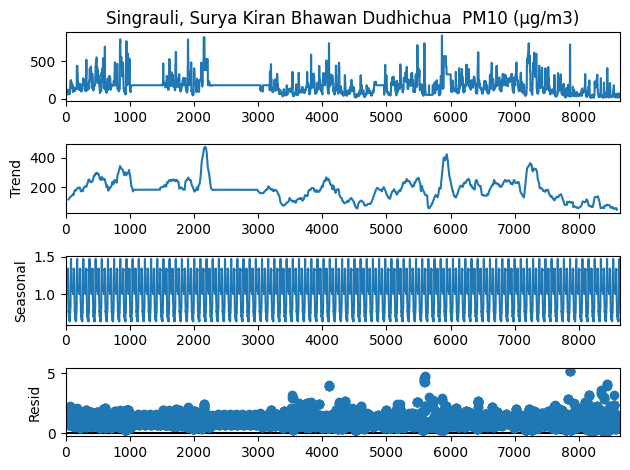

<Figure size 2000x1000 with 0 Axes>

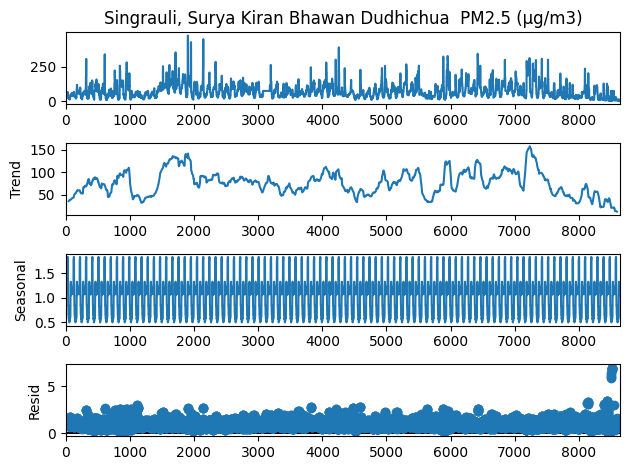

<Figure size 2000x1000 with 0 Axes>

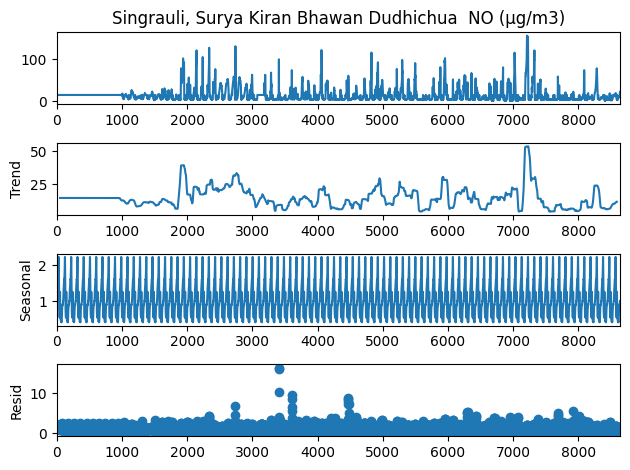

<Figure size 2000x1000 with 0 Axes>

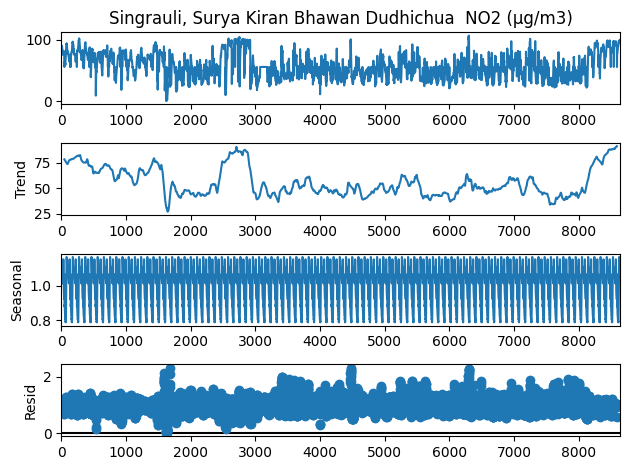

<Figure size 2000x1000 with 0 Axes>

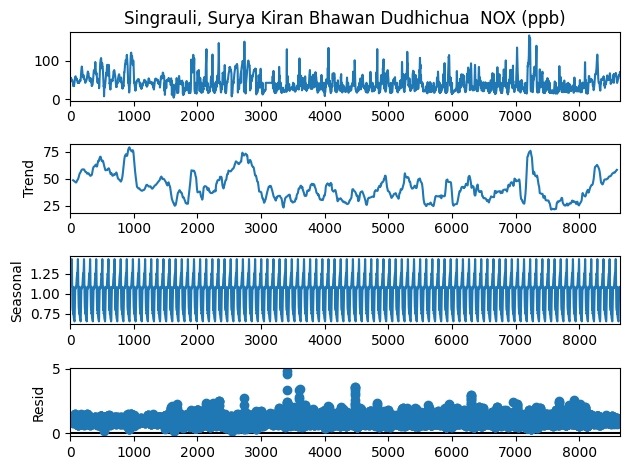

<Figure size 2000x1000 with 0 Axes>

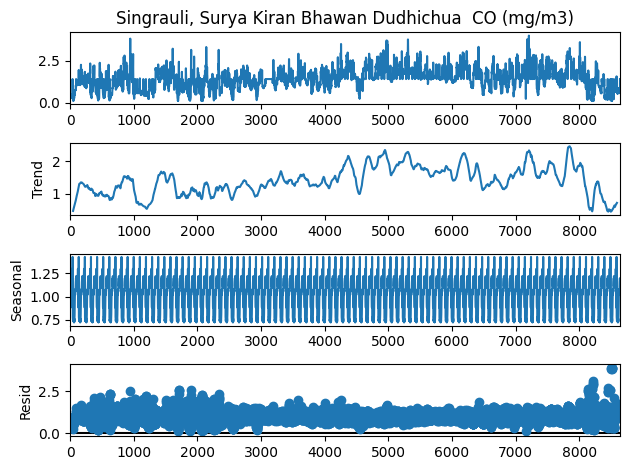

<Figure size 2000x1000 with 0 Axes>

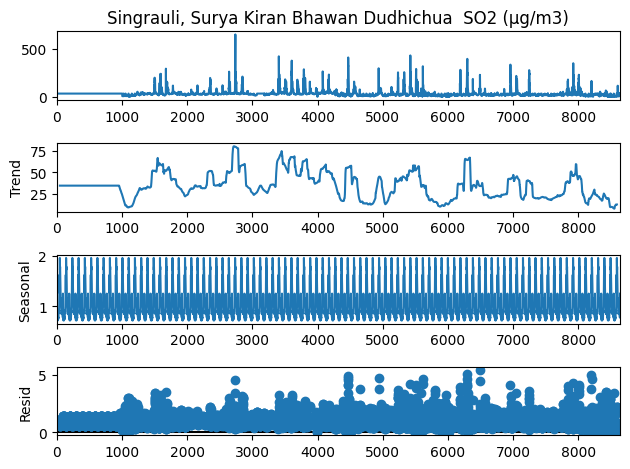

<Figure size 2000x1000 with 0 Axes>

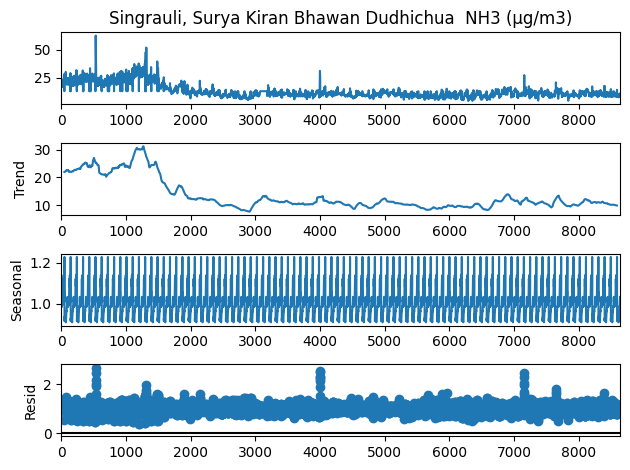

<Figure size 2000x1000 with 0 Axes>

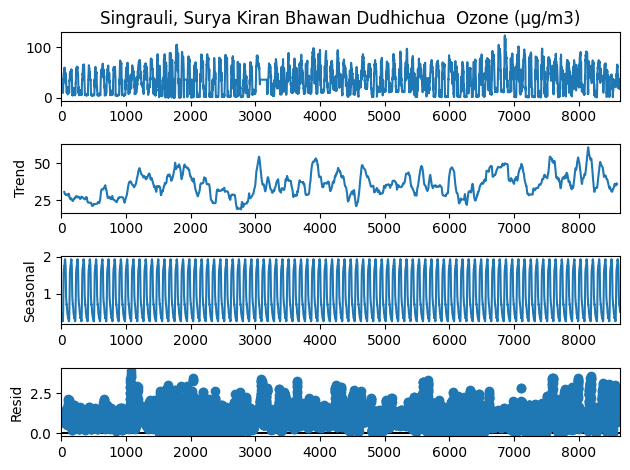

<Figure size 2000x1000 with 0 Axes>

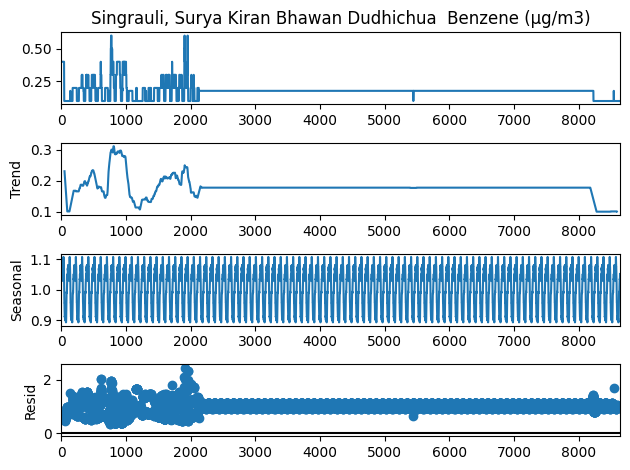

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
for column in column_names1[3:]:
    #plt.figure(figsize=(20, 100))
    decompose_result_mult = seasonal_decompose(df1[column], period = 96, model="multiplicative")
    trend = decompose_result_mult.trend
    seasonal = decompose_result_mult.seasonal
    plt.figure(figsize=(20, 10))
    decompose_result_mult.plot()

<Figure size 4000x8000 with 0 Axes>

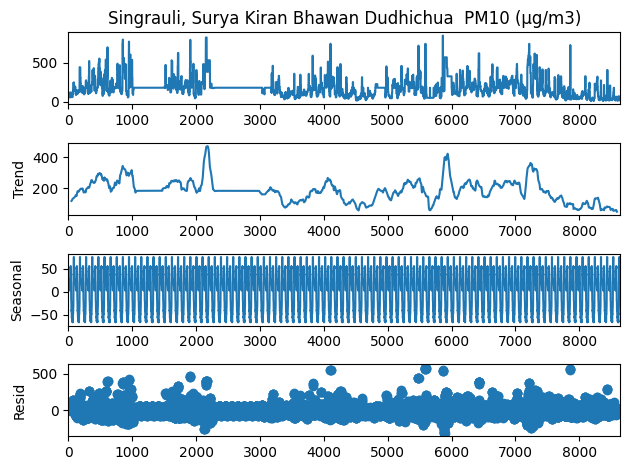

<Figure size 4000x8000 with 0 Axes>

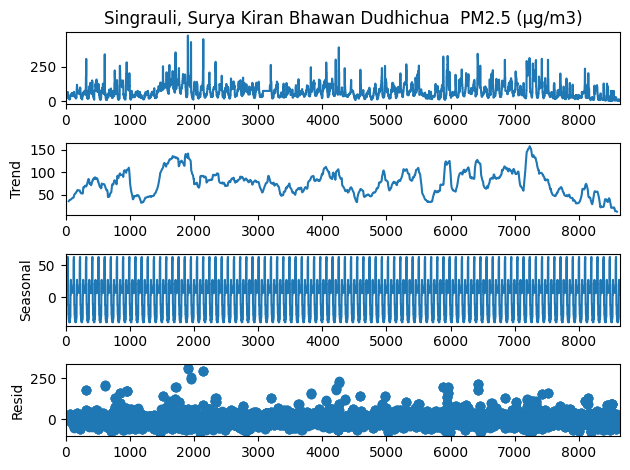

<Figure size 4000x8000 with 0 Axes>

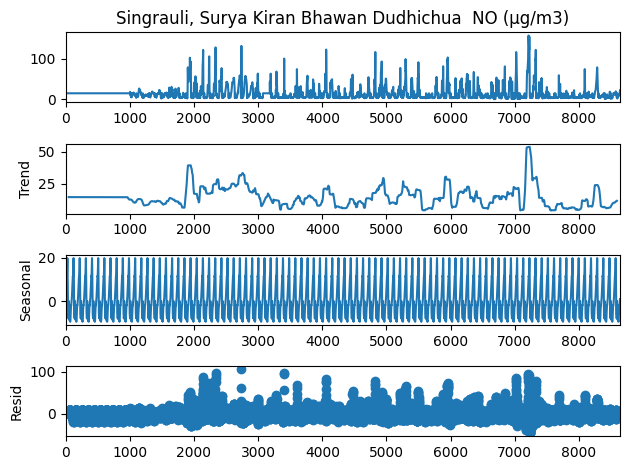

<Figure size 4000x8000 with 0 Axes>

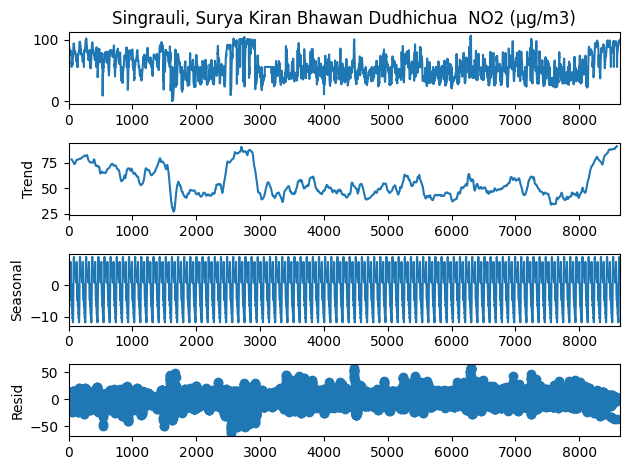

<Figure size 4000x8000 with 0 Axes>

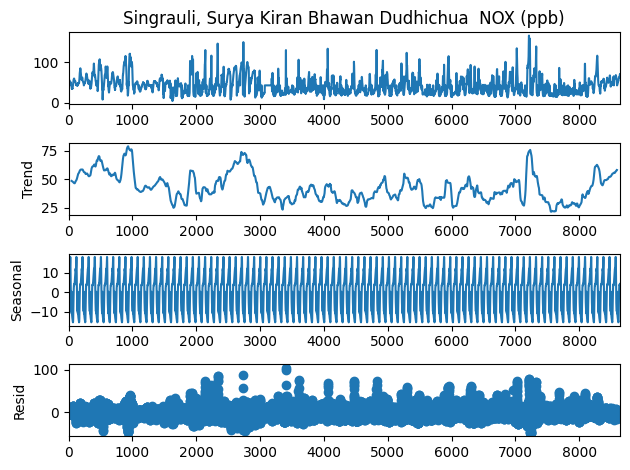

<Figure size 4000x8000 with 0 Axes>

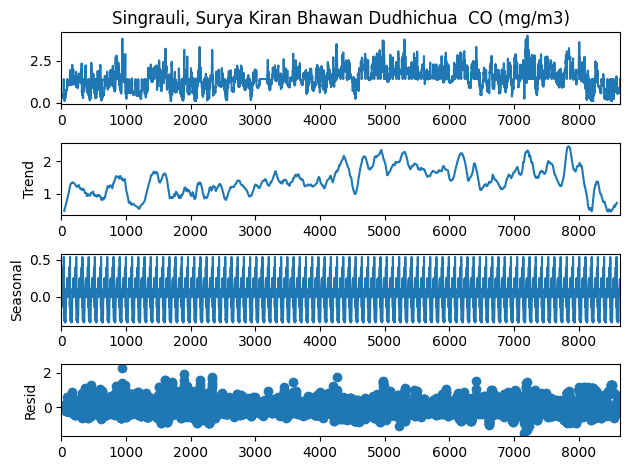

<Figure size 4000x8000 with 0 Axes>

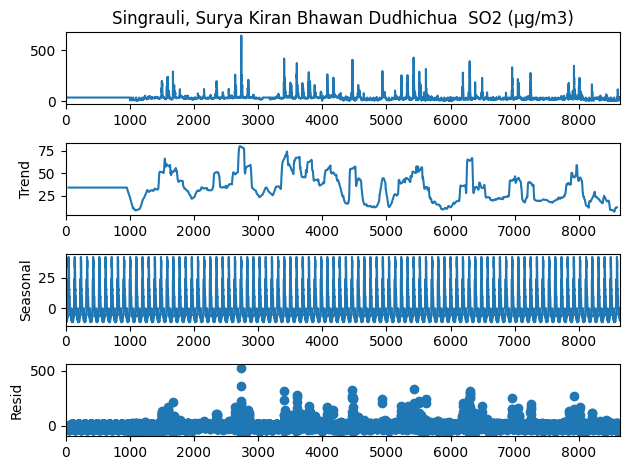

<Figure size 4000x8000 with 0 Axes>

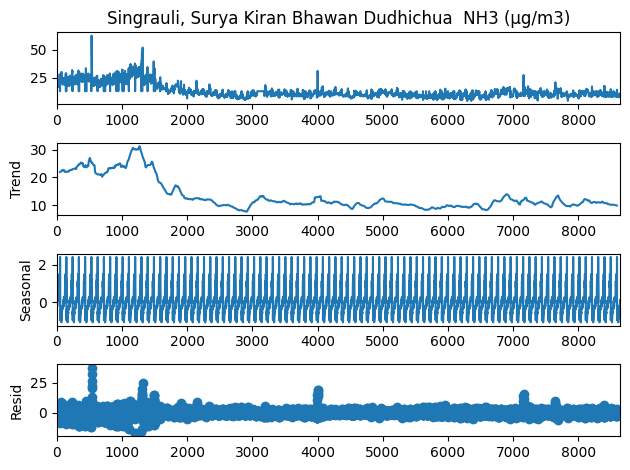

<Figure size 4000x8000 with 0 Axes>

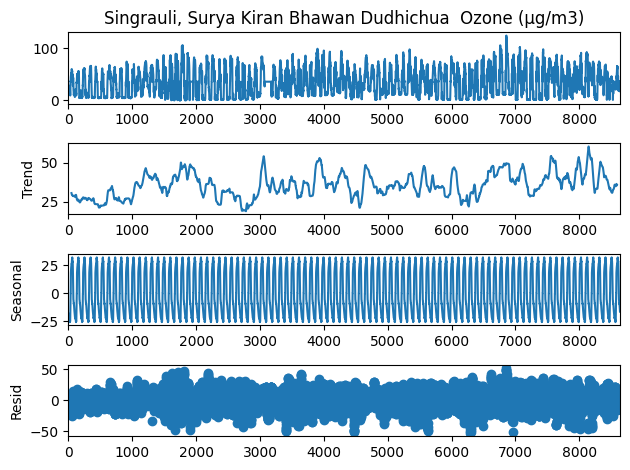

<Figure size 4000x8000 with 0 Axes>

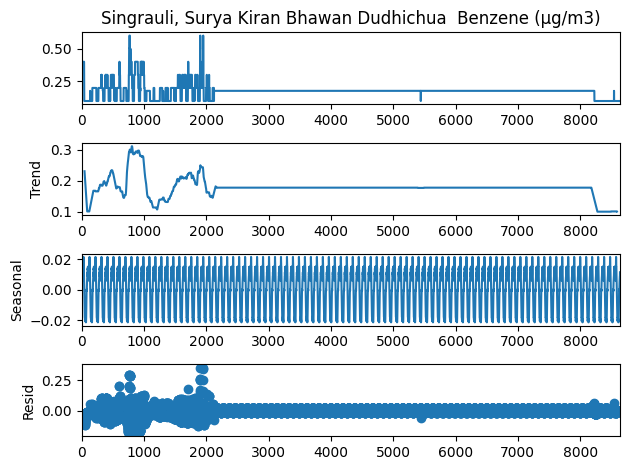

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
for column in column_names1[3:]:
    decompose_result_add = seasonal_decompose(df1[column], period = 96, model="additive")
    plt.figure(figsize=(40, 80))
    trend = decompose_result_add.trend
    seasonal = decompose_result_add.seasonal
    decompose_result_add.plot()

Since the seasonality graph fluctions remain relatively constant over time , it suggests additive seasonality.

The trend appears to be random but the seasonality graph exhibits certian patterns, which means that the time series exhibit recurring patterns or cycles at regular intervals. While it may be challenging to make long-term predictions based on the random trend, the presence of strong seasonality allows for short-term forecasting. Seasonal patterns provide valuable information for forecasting future values within each seasonal cycle. It is useful to decompose the time series into its individual components, such as trend, seasonality, and residual, to better understand their contributions. The random trend suggests focusing on modeling the seasonality component explicitly.

In [ ]:
df1.columns

Index(['#', 'From', 'To (Interval: 15M)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  PM10 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  PM2.5 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NO (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NO2 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NOX (ppb)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  SO2 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NH3 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  Ozone (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3)'],
      dtype='object')

In [ ]:
df1=df1.drop('Singrauli, Surya Kiran Bhawan Dudhichua  NOX (ppb)', axis=1)

In [ ]:
df1['Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3)']=df1['Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3)']*1000

In [ ]:
from sklearn.decomposition import PCA
pca=PCA(n_components=1)
columns_to_exclude=['#', 'From', 'To (Interval: 15M)']
data_pca=df1.copy()
data_pca[columns_to_exclude] = 0
pca.fit(data_pca)
weights = pca.components_[0]
normalized_weights = weights / sum(abs(weights))
print("Derived Weights:", normalized_weights)

Derived Weights: [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  3.62422122e-02
  3.34382739e-02  8.54758284e-03 -1.85622780e-03  9.00368457e-01
 -2.68874111e-03 -1.98786316e-03 -1.48564736e-02  1.41680042e-05]


In [ ]:
df1['Total']=(df1['Singrauli, Surya Kiran Bhawan Dudhichua  PM10 (µg/m3)']*normalized_weights[3])
+(df1['Singrauli, Surya Kiran Bhawan Dudhichua  PM2.5 (µg/m3)']*normalized_weights[4])
+(df1['Singrauli, Surya Kiran Bhawan Dudhichua  NO (µg/m3)']*normalized_weights[5])
+(df1['Singrauli, Surya Kiran Bhawan Dudhichua  NO2 (µg/m3)']*normalized_weights[6])
+(df1['Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3)']*normalized_weights[7])
+(df1['Singrauli, Surya Kiran Bhawan Dudhichua  SO2 (µg/m3)']*normalized_weights[8])
+(df1['Singrauli, Surya Kiran Bhawan Dudhichua  NH3 (µg/m3)']*normalized_weights[9])
+(df1['Singrauli, Surya Kiran Bhawan Dudhichua  Ozone (µg/m3)']*normalized_weights[10])
+(df1['Singrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3)']*normalized_weights[11])
df1.head()

,#,From,To (Interval: 15M),"Singrauli, Surya Kiran Bhawan Dudhichua PM10 (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua PM2.5 (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua NO (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua NO2 (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua CO (mg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua SO2 (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua NH3 (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua Ozone (µg/m3)","Singrauli, Surya Kiran Bhawan Dudhichua Benzene (µg/m3)",Total
0,1,2023-02-01 00:00:00,2023-02-01 00:15:00,95.0,35.0,14.667274,90.1,310.0,34.312991,17.7,28.1,0.4,3.44301
1,2,2023-02-01 00:15:00,2023-02-01 00:30:00,95.0,35.0,14.667274,88.0,330.0,34.312991,18.3,27.1,0.4,3.44301
2,3,2023-02-01 00:30:00,2023-02-01 00:45:00,95.0,35.0,14.667274,87.7,380.0,34.312991,19.7,24.9,0.4,3.44301
3,4,2023-02-01 00:45:00,2023-02-01 01:00:00,122.0,34.0,14.667274,88.9,380.0,34.312991,21.3,21.9,0.4,4.42155
4,5,2023-02-01 01:00:00,2023-02-01 01:15:00,122.0,34.0,14.667274,90.0,380.0,34.312991,22.3,16.7,0.4,4.42155


/usr/local/lib/python3.10/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


Text(0.5, 1.0, 'PACFSingrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3)')

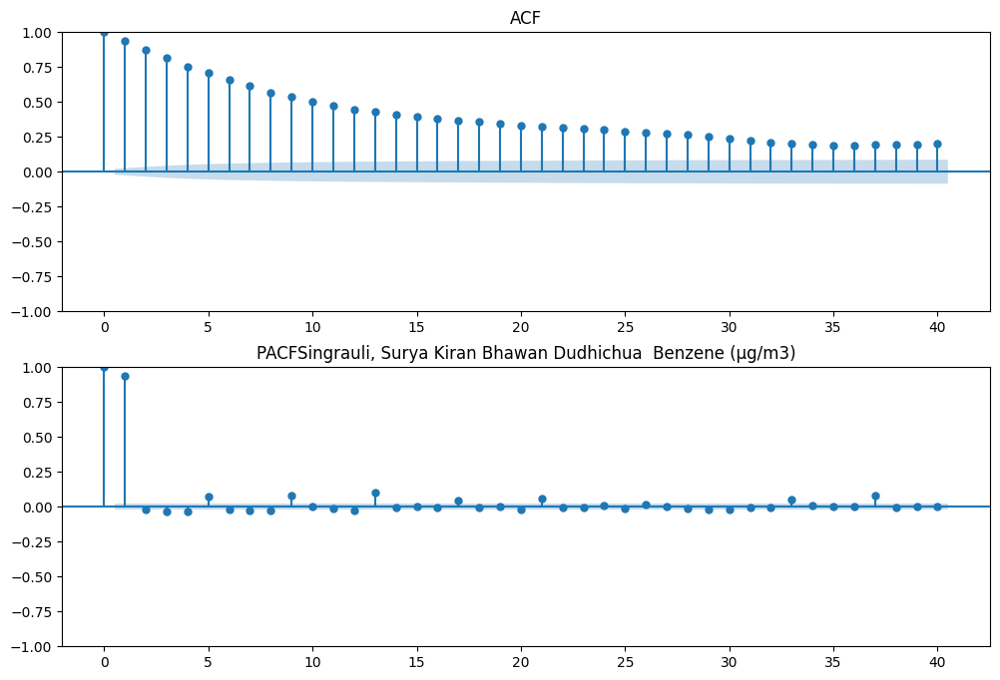

In [ ]:
for column in column_names1[3:]:
  fig = plt.figure(figsize=(12,8))
  ax1 = fig.add_subplot(211)
  fig = sm.graphics.tsa.plot_acf(df1['Total'].dropna(),lags=40,ax=ax1)
  ax1.set_title('ACF of '+column)
  ax2 = fig.add_subplot(212)
  fig = sm.graphics.tsa.plot_pacf(df1['Total'].dropna(),lags=40,ax=ax2)
  ax2.set_title('PACF of '+column)

                            AutoReg Model Results                             
Dep. Variable:                  Total   No. Observations:                 8635
Model:                    AutoReg(36)   Log Likelihood              -15758.428
Method:               Conditional MLE   S.D. of innovations              1.512
Date:                Wed, 28 Jun 2023   AIC                          31592.856
Time:                        03:54:51   BIC                          31861.113
Sample:                            36   HQIC                         31684.345
                                 8635                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3451      0.038      9.063      0.000       0.270       0.420
Total.L1       0.9623      0.011     89.240      0.000       0.941       0.983
Total.L2       0.0101      0.015      0.675      0.5

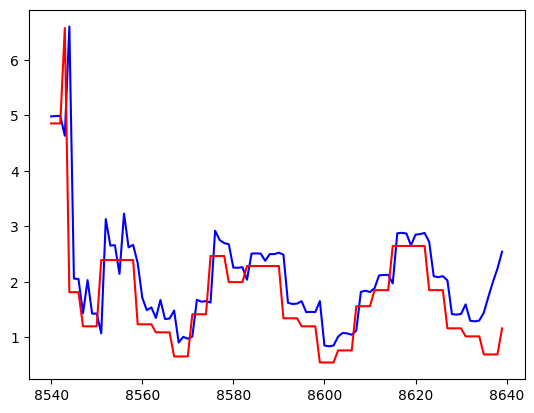

0.7207738056313111


In [ ]:
train_data=df1['Total'][:-100]
test_data=df1['Total'][-100:]
ar_model=AutoReg(df1['Total'][:-5], lags=36).fit()
print(ar_model.summary())
pred = ar_model.predict(start = len(train_data), end = len(df1) - 1, dynamic=False)
plt.plot(pred, color = "blue")
plt.plot(test_data, color = "red")
plt.show()
rmse = math.sqrt(mean_squared_error(pred, test_data))
print(rmse)

In [ ]:
df1['From']=pd.to_datetime(df['From'])
df1['From'].dtype

dtype('<M8[ns]')

In [ ]:
#df1.set_index('From', inplace=True)

<Axes: >

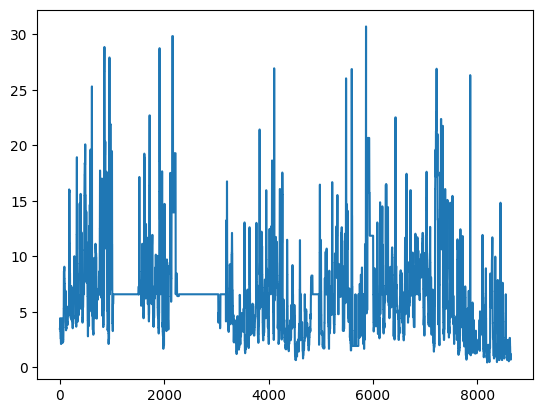

In [ ]:
df1['Total'].plot()

In [ ]:
df1.columns

Index(['#', 'From', 'To (Interval: 15M)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  PM10 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  PM2.5 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NO (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NO2 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  SO2 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NH3 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  Ozone (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3)', 'Total'],
      dtype='object')

In [ ]:
from scipy.signal import argrelextrema

#df1_daily = df1.resample('D').first()
decompose_result_mult = seasonal_decompose(df1['Total'], period=4*24, model="additive")
seasonal = decompose_result_mult.seasonal

# Find local minima and maxima indices for the seasonal component
minima_indices = argrelextrema(seasonal.values, comparator=np.less)[0]
maxima_indices = argrelextrema(seasonal.values, comparator=np.greater)[0]

# Get the corresponding timestamps
timestamps = df1.index

# Print the timestamps of minima
print("Minima Timestamps:")
for index in minima_indices:
    print(timestamps[index])

# Print the timestamps of maxima
print("Maxima Timestamps:")
for index in maxima_indices:
    print(timestamps[index])

Minima Timestamps:
4
7
9
11
13
17
20
23
26
29
32
35
37
48
54
59
64
67
69
73
82
88
93
96
100
103
105
107
109
113
116
119
122
125
128
131
133
144
150
155
160
163
165
169
178
184
189
192
196
199
201
203
205
209
212
215
218
221
224
227
229
240
246
251
256
259
261
265
274
280
285
288
292
295
297
299
301
305
308
311
314
317
320
323
325
336
342
347
352
355
357
361
370
376
381
384
388
391
393
395
397
401
404
407
410
413
416
419
421
432
438
443
448
451
453
457
466
472
477
480
484
487
489
491
493
497
500
503
506
509
512
515
517
528
534
539
544
547
549
553
562
568
573
576
580
583
585
587
589
593
596
599
602
605
608
611
613
624
630
635
640
643
645
649
658
664
669
672
676
679
681
683
685
689
692
695
698
701
704
707
709
720
726
731
736
739
741
745
754
760
765
768
772
775
777
779
781
785
788
791
794
797
800
803
805
816
822
827
832
835
837
841
850
856
861
864
868
871
873
875
877
881
884
887
890
893
896
899
901
912
918
923
928
931
933
937
946
952
957
960
964
967
969
971
973
977
980
983
986
989
992
995


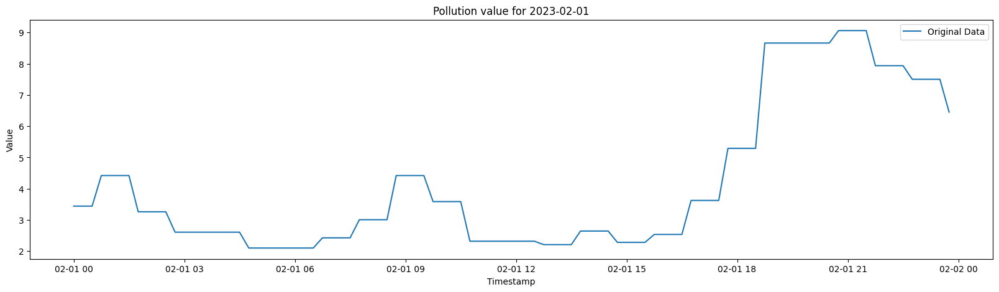

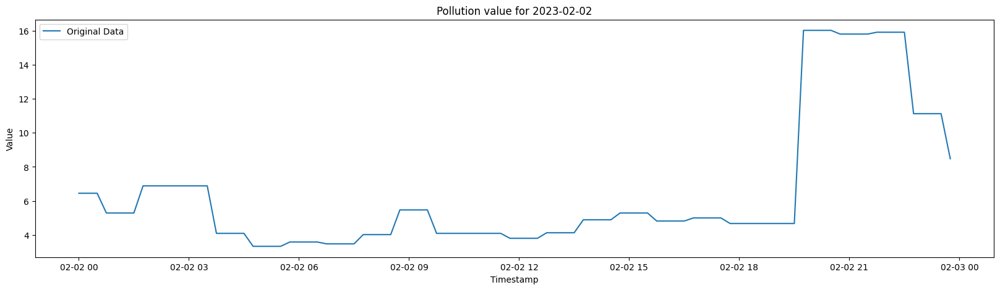

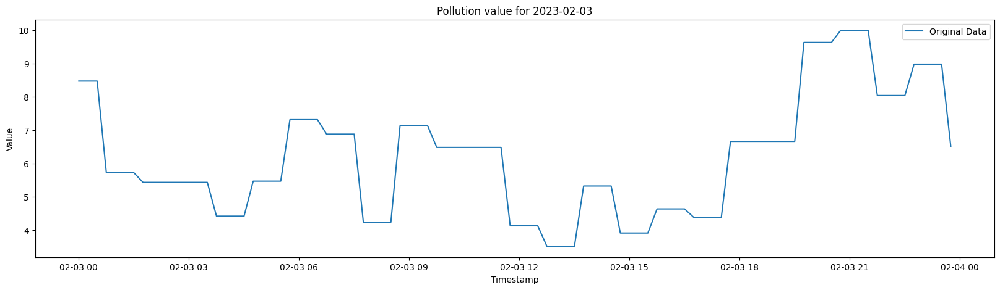

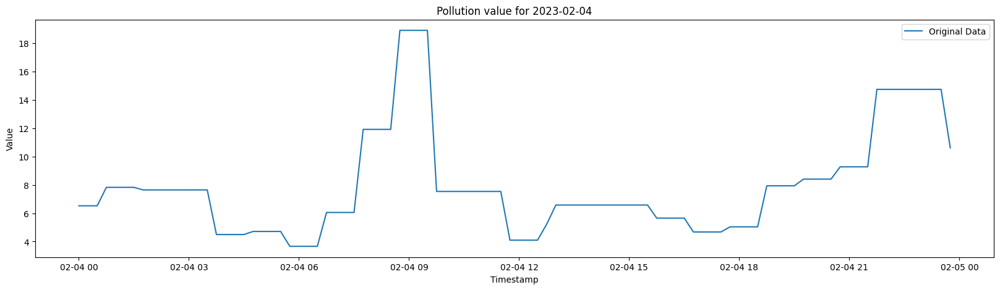

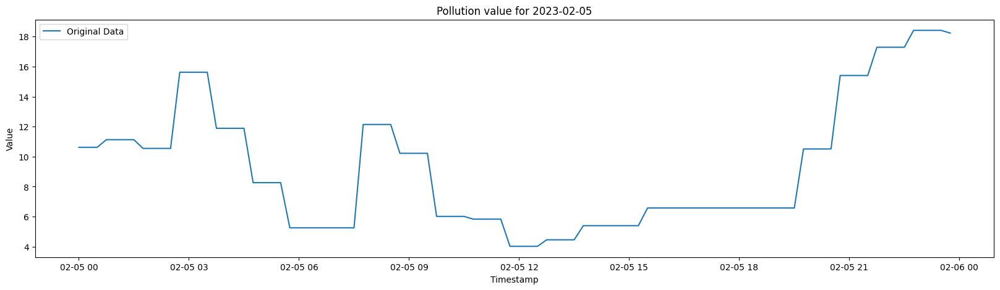

...

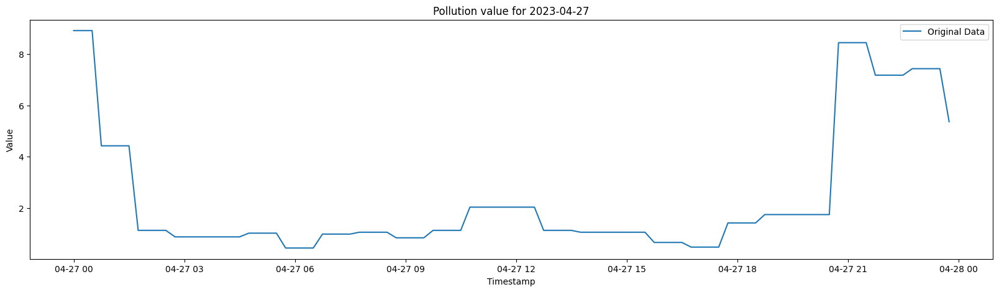

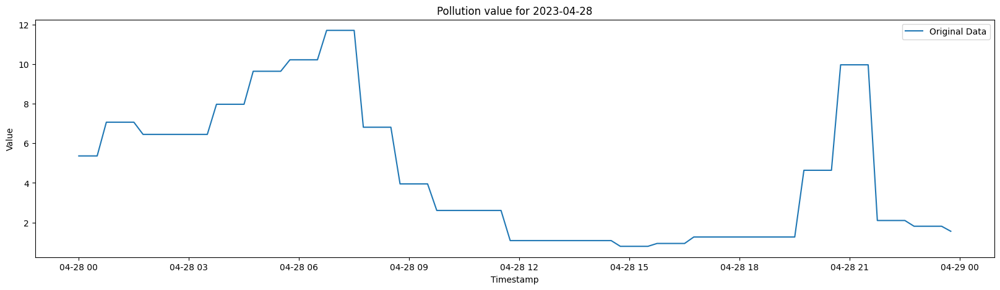

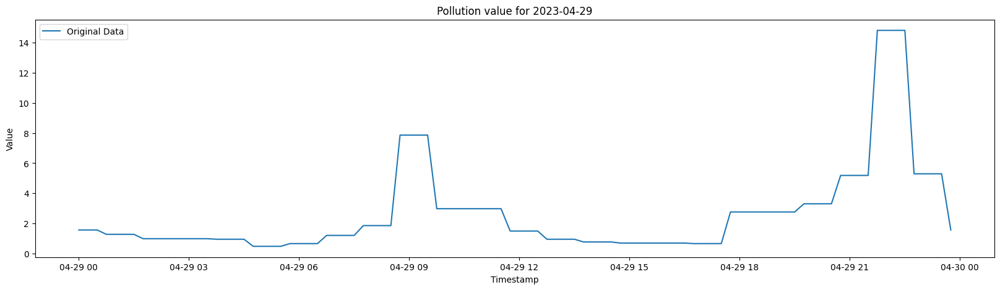

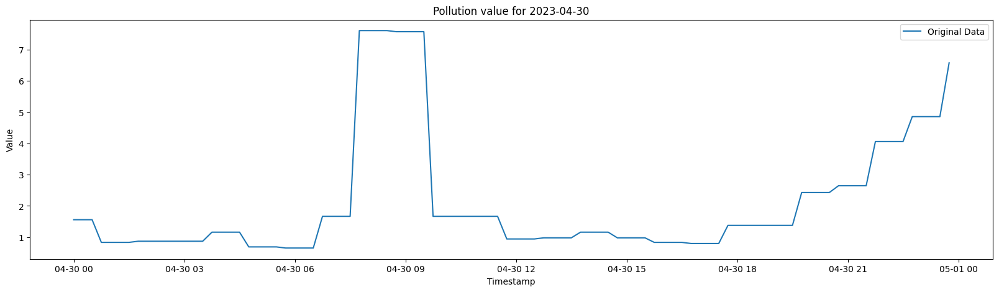

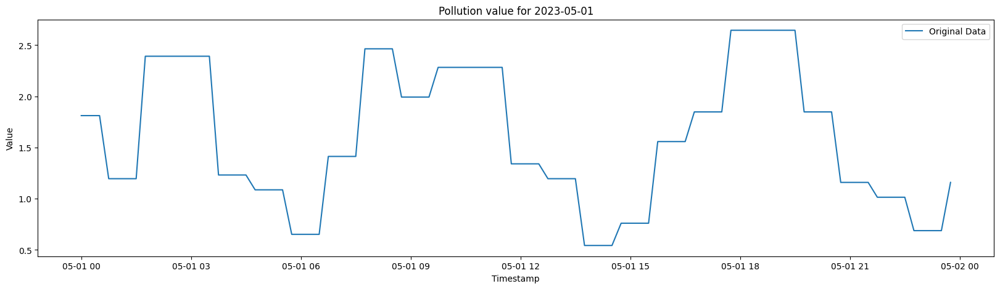

In [ ]:
#import matplotlib.pyplot as plt
from scipy.signal import argrelextrema

# Assuming you have a DataFrame named 'data' with a 'Timestamp' column and a 'Value' column

# Set the time range of interest
start_time = '00:00:00'
end_time = '23:59:59'

# Filter the original data within the time range for each day
filtered_data = df1[df1['From'].dt.strftime('%H:%M:%S').between(start_time, end_time)]

# Get the dates from the filtered data
dates = filtered_data['From'].dt.date.unique()

# Plot the original data along with maxima and minima for each day
for date in dates:
    # Filter data for the current date
    daily_data = filtered_data[filtered_data['From'].dt.date == date]

    # Find maxima and minima indices
    maxima_indices = argrelextrema(daily_data['Total'].values, comparator=np.greater)[0]
    minima_indices = argrelextrema(daily_data['Total'].values, comparator=np.less)[0]

    # Plot the original data
    plt.figure(figsize=(20,5))
    plt.plot(daily_data['From'], daily_data['Total'], label='Original Data')

    # Plot maxima
    #plt.scatter(daily_data.iloc[maxima_indices]['From'], daily_data.iloc[maxima_indices]['Total'], color='red', label='Maxima')

    # Plot minima
    #plt.scatter(daily_data.iloc[minima_indices]['From'], daily_data.iloc[minima_indices]['Total'], color='blue', label='Minima')

    plt.title(f"Pollution value for {date}")
    plt.xlabel('Timestamp')
    plt.ylabel('Value')
    plt.legend()
    plt.show()


In [ ]:
df2=pd.read_csv('EE798Q.csv')
#column_names2=df2.columns

In [ ]:
from scipy import optimize
df2['From']=pd.to_datetime(df['From'], infer_datetime_format=True)
#df2.set_index('From', inplace=True)

In [ ]:
column_names2=df2.columns
print(column_names2)

Index(['#', 'From', 'To (Interval: 15M)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  PM10 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  PM2.5 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NO (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NO2 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NOX (ppb)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  SO2 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  NH3 (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  Ozone (µg/m3)',
       'Singrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3)'],
      dtype='object')


In [ ]:
df2 = df2.drop(df2.index[-3:])
for column in column_names2[3:]:
    df2[column].fillna(df2[column].mean(), inplace=True)

In [ ]:
df2['Total']=(df2['Singrauli, Surya Kiran Bhawan Dudhichua  PM10 (µg/m3)']*normalized_weights[3])
+(df2['Singrauli, Surya Kiran Bhawan Dudhichua  PM2.5 (µg/m3)']*normalized_weights[4])
+(df2['Singrauli, Surya Kiran Bhawan Dudhichua  NO (µg/m3)']*normalized_weights[5])
+(df2['Singrauli, Surya Kiran Bhawan Dudhichua  NO2 (µg/m3)']*normalized_weights[6])
+(df2['Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3)']*normalized_weights[7])
+(df2['Singrauli, Surya Kiran Bhawan Dudhichua  SO2 (µg/m3)']*normalized_weights[8])
+(df2['Singrauli, Surya Kiran Bhawan Dudhichua  NH3 (µg/m3)']*normalized_weights[9])
+(df2['Singrauli, Surya Kiran Bhawan Dudhichua  Ozone (µg/m3)']*normalized_weights[10])
+(df2['Singrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3)']*normalized_weights[11])

0       0.000006
1       0.000006
2       0.000006
3       0.000006
4       0.000006
          ...   
8635    0.000001
8636    0.000001
8637    0.000001
8638    0.000001
8639    0.000001
Name: Singrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3), Length: 8640, dtype: float64

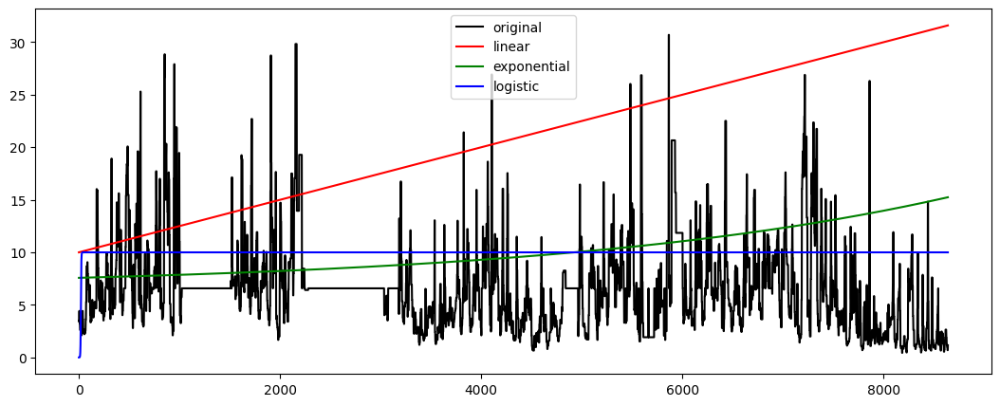

In [ ]:
def f(x):
    return 10 + 0.0025*x

y_linear = f(x=np.arange(len(df2)))
'''
Exponential function: f(x) = a + b^x
'''
def f(x):
    return df2['Total'].mean() + 1.00025**x

y_exponential = f(x=np.arange(len(df2)))
'''
Logistic function: f(x) = a / (1 + e^(-b*(x-c)))
'''
def f(x):
    return 10 / (1 + np.exp(-0.5*(x-20)))

y_logistic = f(x=np.arange(len(df2)))

#for column in column_names2[2:]:
fig, ax = plt.subplots(figsize=(13,5))
ax.plot(df2['Total'].index, df2['Total'].values, label='original', color="black")
ax.plot(df2[column].index, y_linear, label="linear", color="red")
ax.plot(df2['Total'].index, y_exponential, label="exponential", color="green")
ax.plot(df2[column].index, y_logistic, label="logistic", color="blue")
ax.legend()
plt.show()

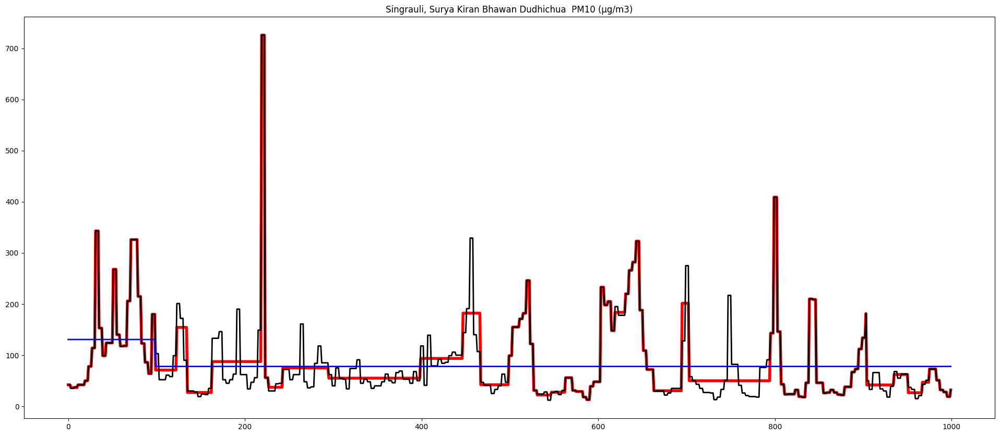

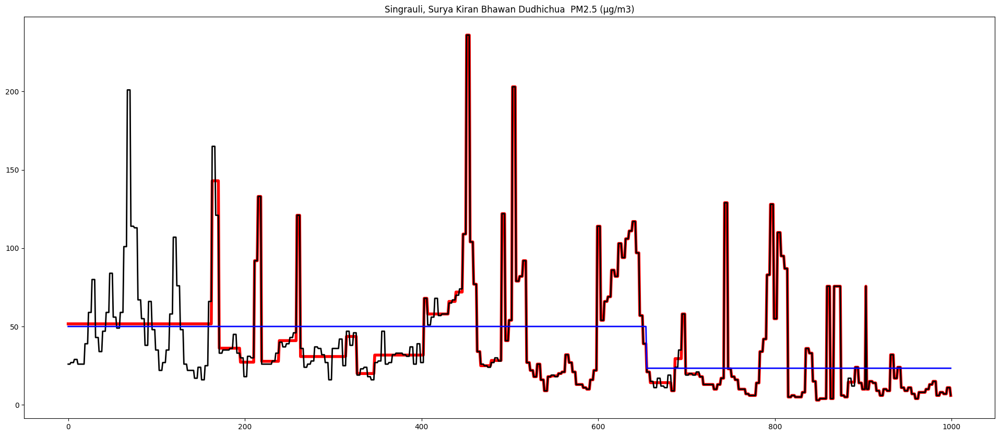

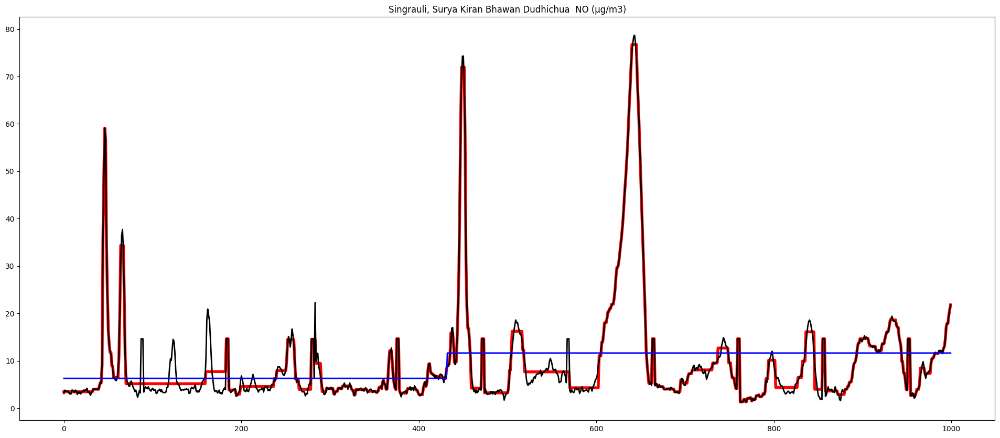

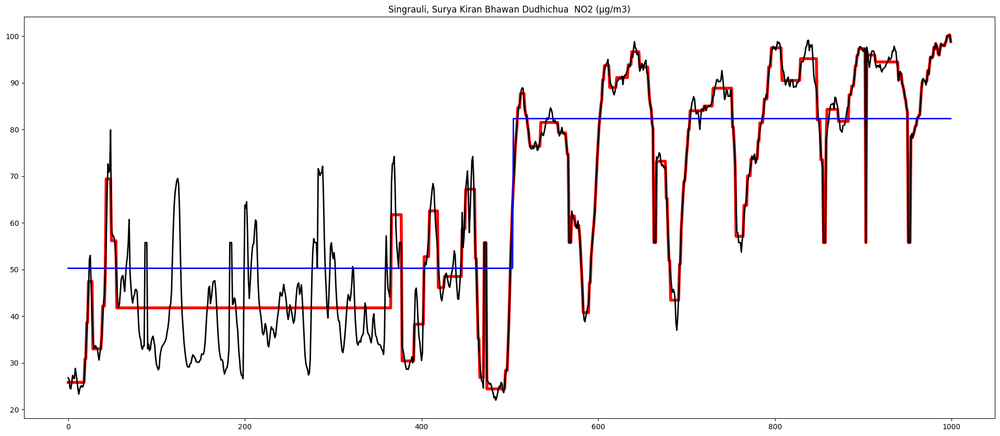

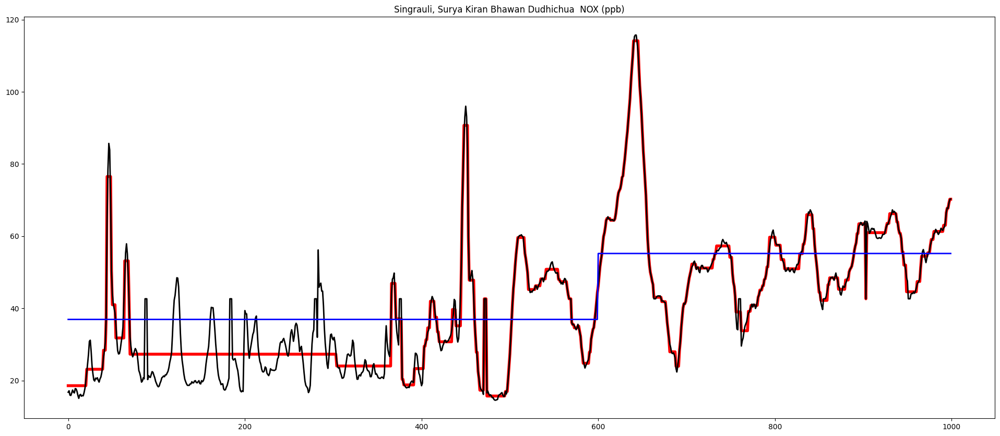

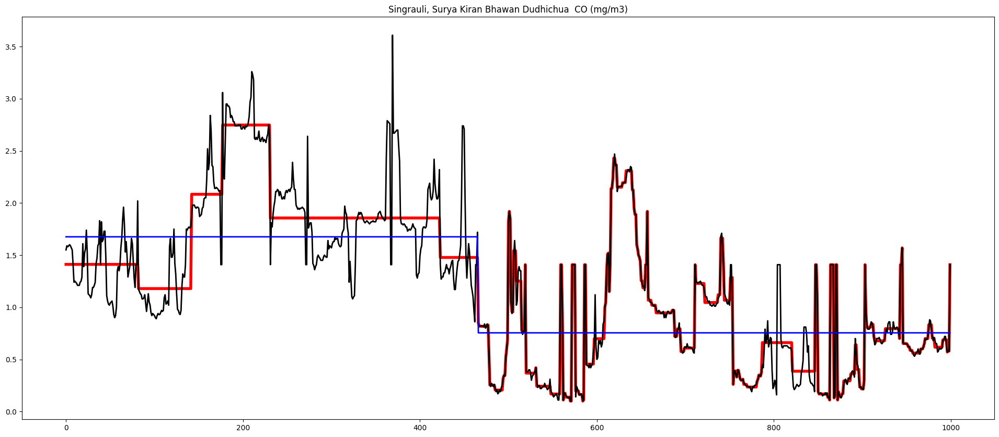

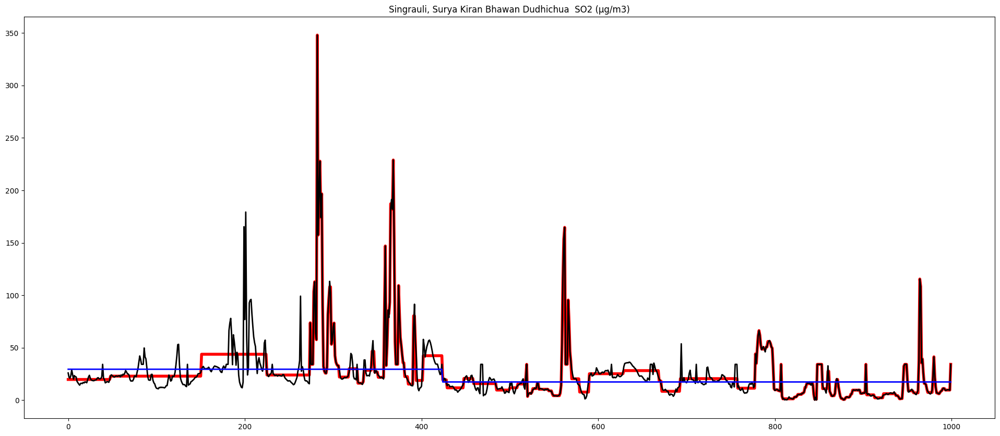

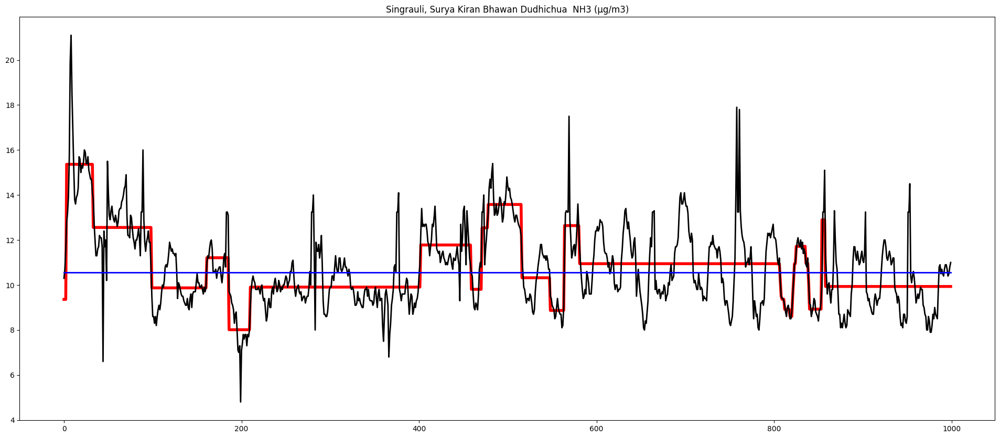

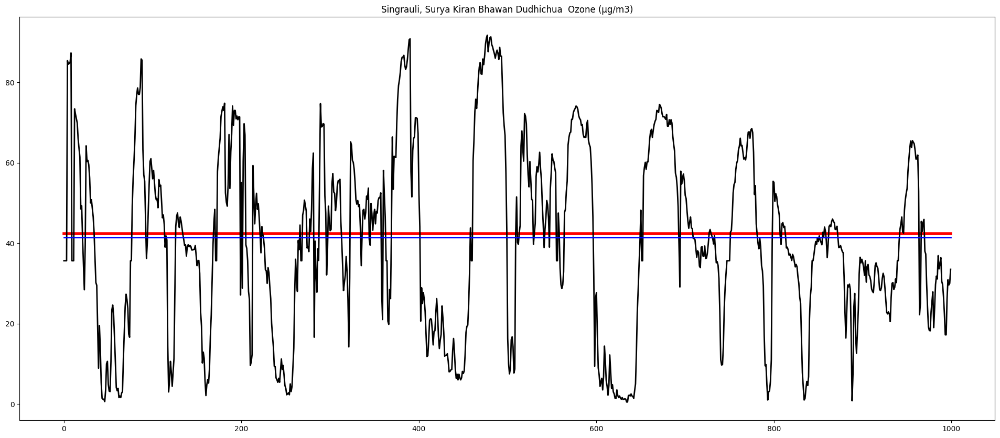

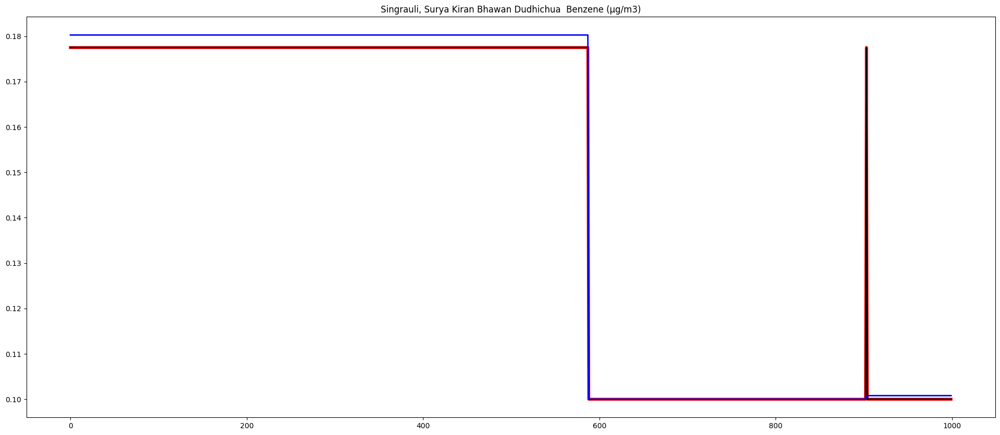

In [ ]:
from sklearn.tree import DecisionTreeRegressor

#fig, axarr = plt.subplots(nrows=1, ncols=1, figsize=(12, 4))

X = np.asarray(list(range(len(df2))))[:, np.newaxis]
#X.reshape(-1,1)
for column in column_names2[3:]:
  y=df2[column].values
  fig, axarr = plt.subplots(nrows=1, ncols=1, figsize=(24, 10))
  clf = DecisionTreeRegressor(max_depth=10)
  clf.fit(X, y)
  y_pred = clf.predict(X)
  pd.Series(y_pred[-1000:]).plot(ax=axarr, linewidth=4, color='red')
  pd.Series(y[-1000:]).plot(ax=axarr, linewidth=2, color='black')

  clf = DecisionTreeRegressor(max_depth=2)
  clf.fit(X, y)
  y_pred = clf.predict(X)
  pd.Series(y_pred[-1000:]).plot(ax=axarr, linewidth=2, color='blue')
  #pd.Series(y).plot(ax=axarr, marker="o", linewidth=0, color='black')

  axarr.set_title(column)

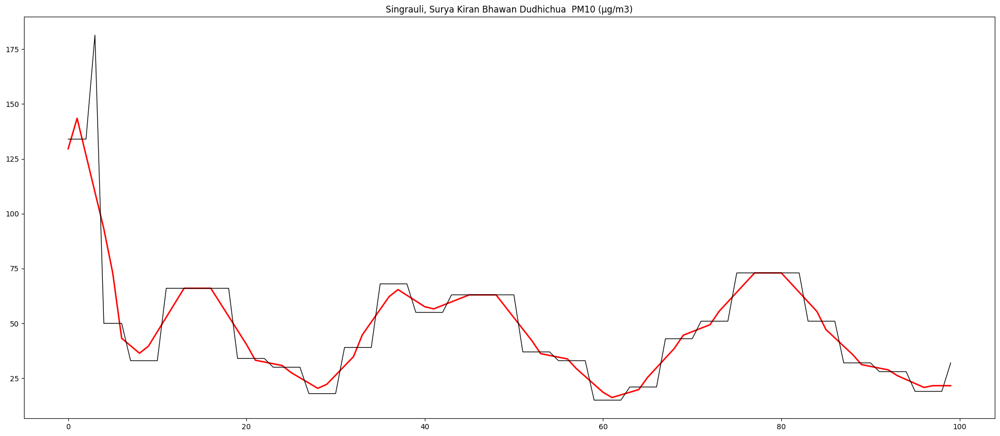

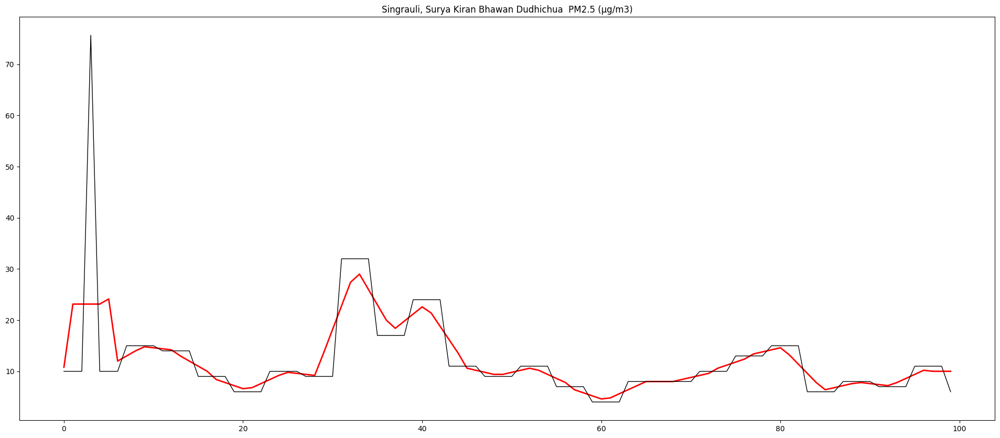

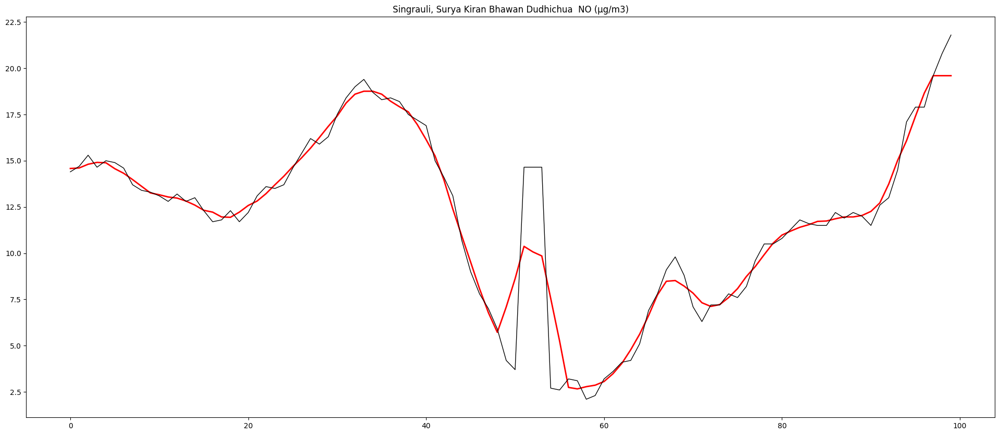

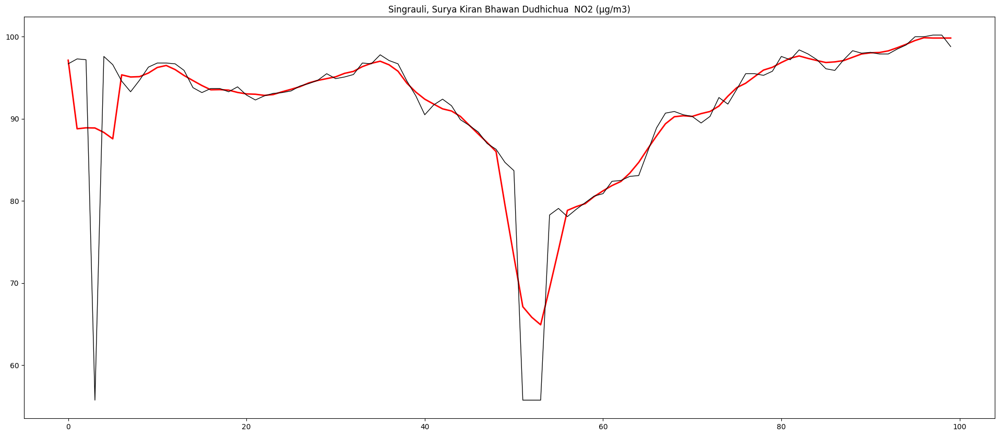

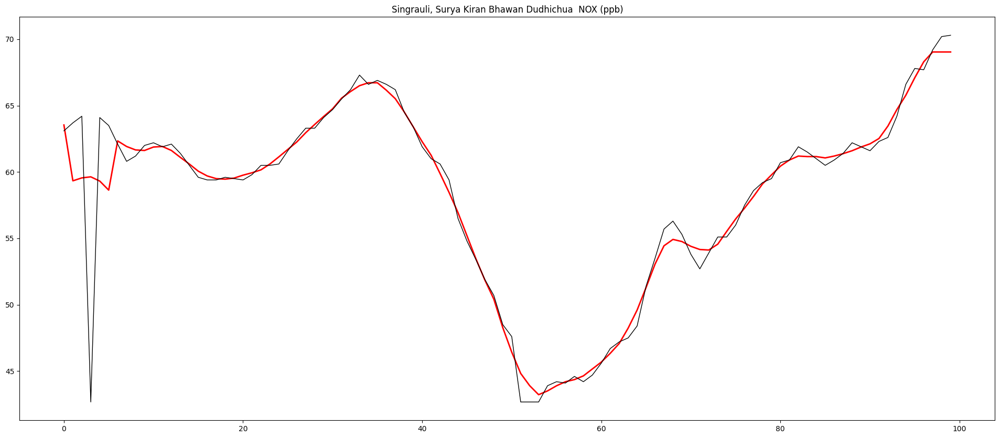

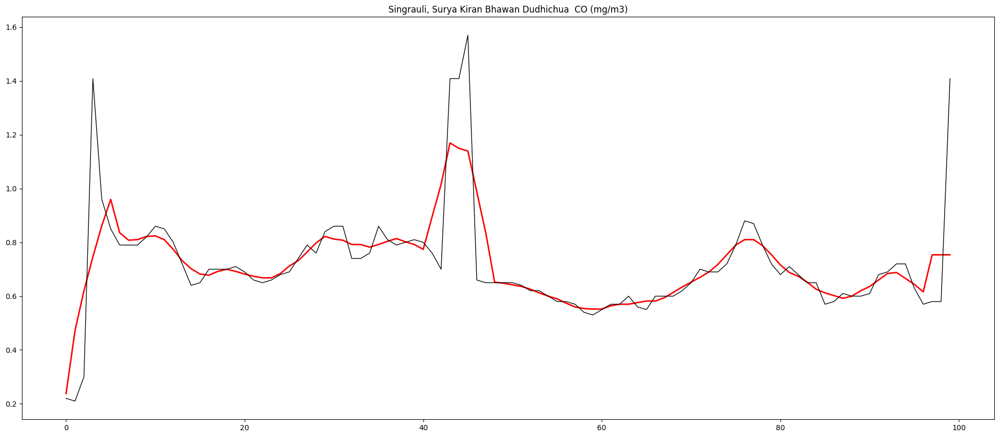

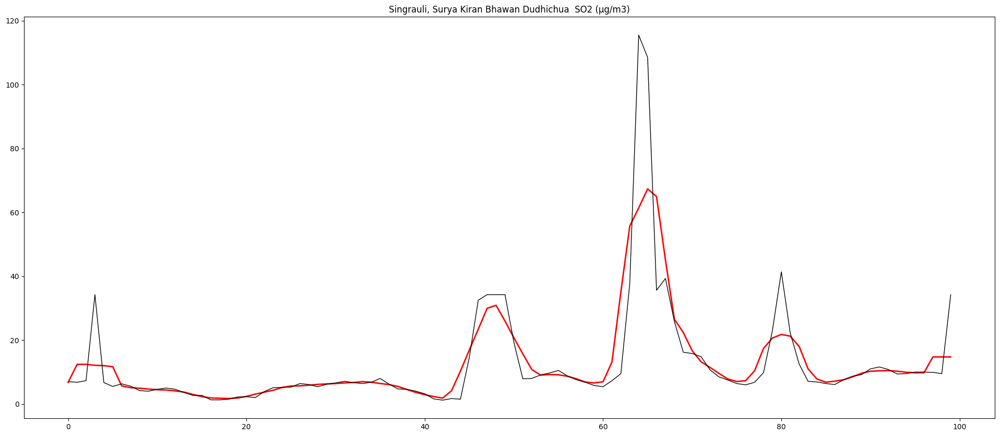

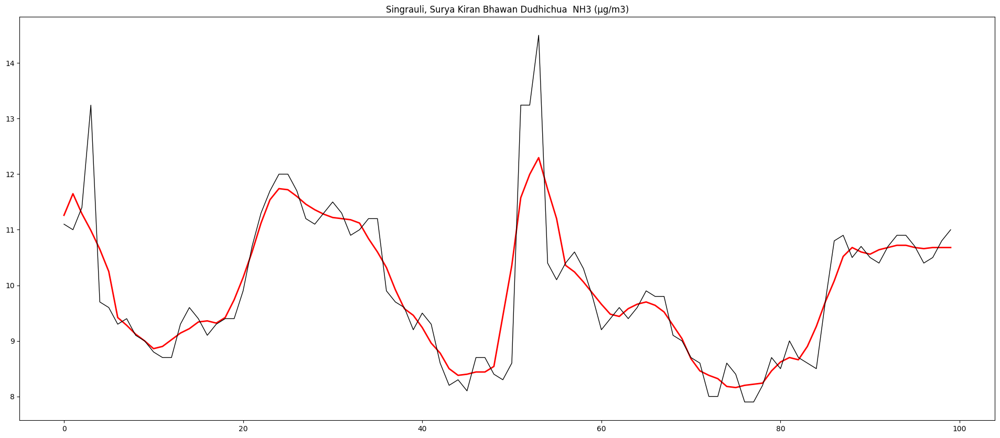

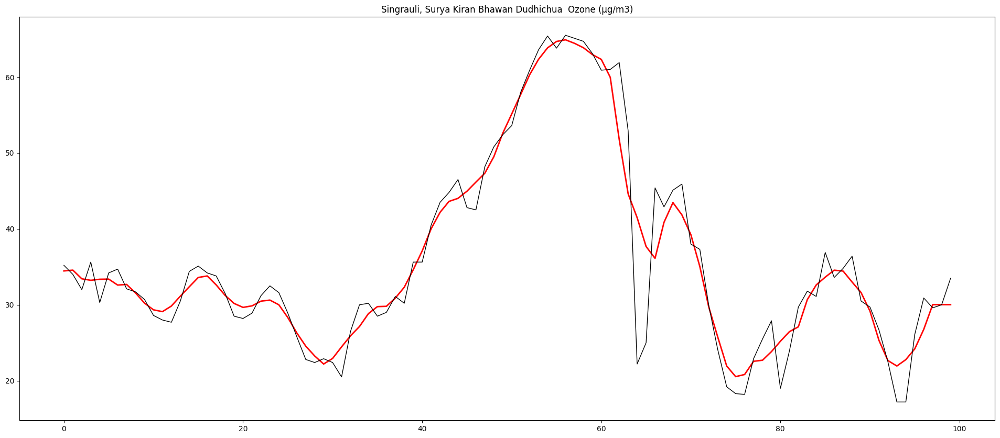

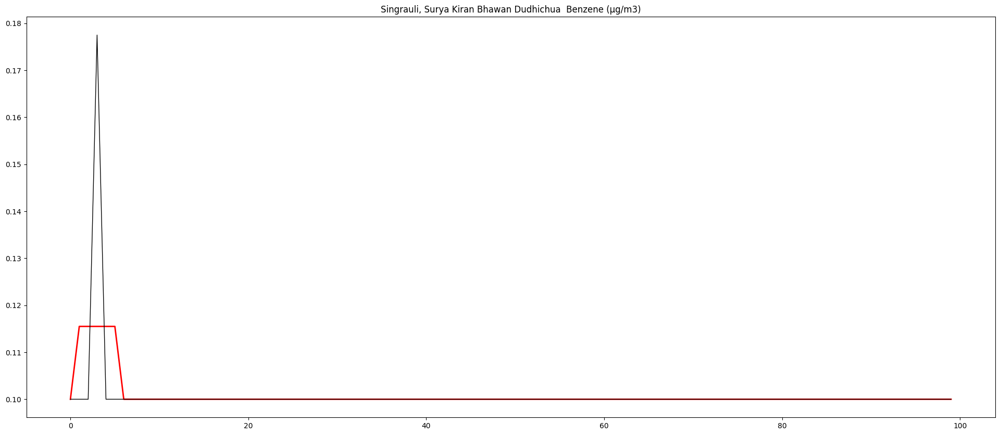

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

#for column in column_names2[3:]:
  #df2[column]=df2[column].astype(float)

for column in column_names2[3:]:
  fig, axarr = plt.subplots(nrows=1, ncols=1, figsize=(24, 10))
  clf = KNeighborsRegressor(n_neighbors=5, weights='uniform')
  y=df2[column].values
  clf.fit(X, y)
  y_pred = clf.predict(X)
  pd.Series(y_pred[-100:]).plot(ax=axarr, linewidth=2, color='red')
  pd.Series(y[-100:]).plot(ax=axarr, linewidth=1, color='black')

  axarr.set_title(column)

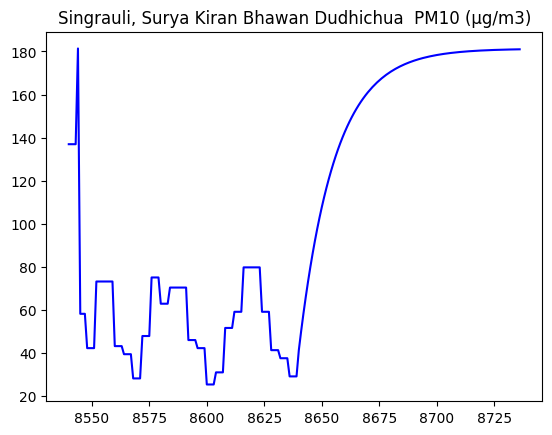

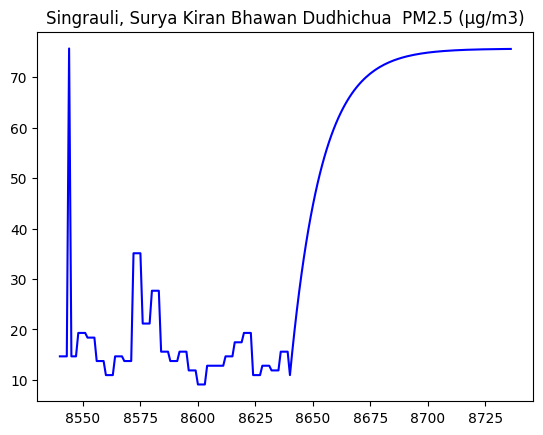

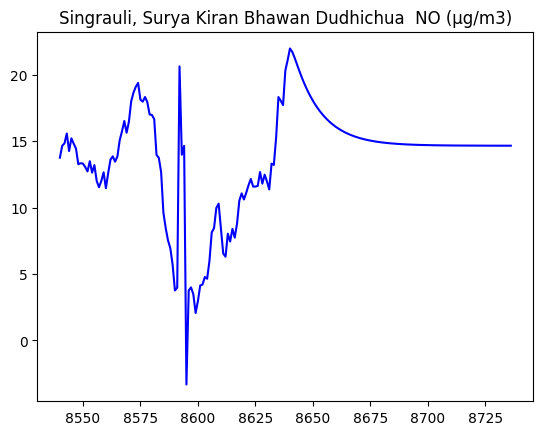

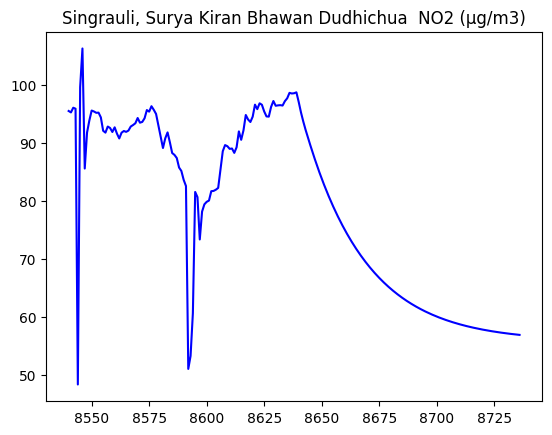

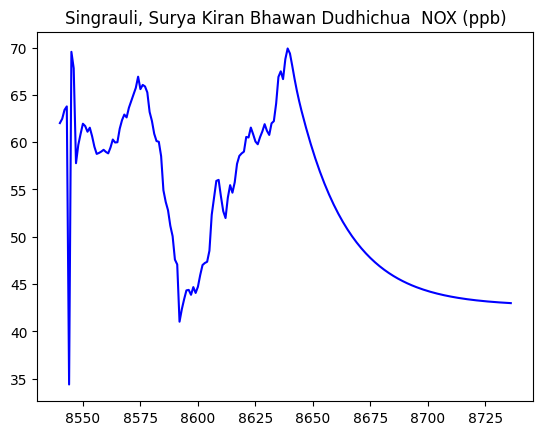

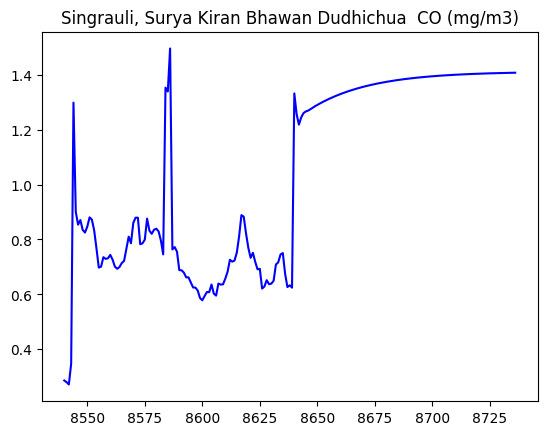

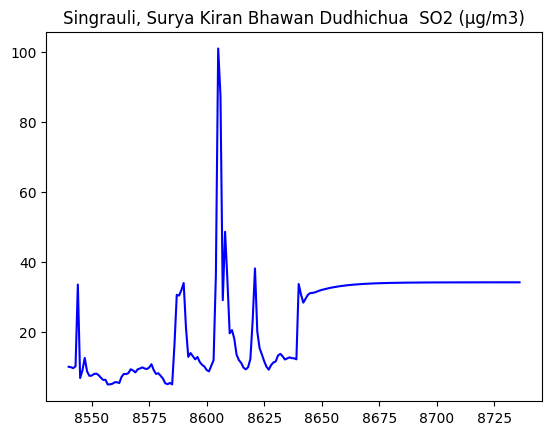

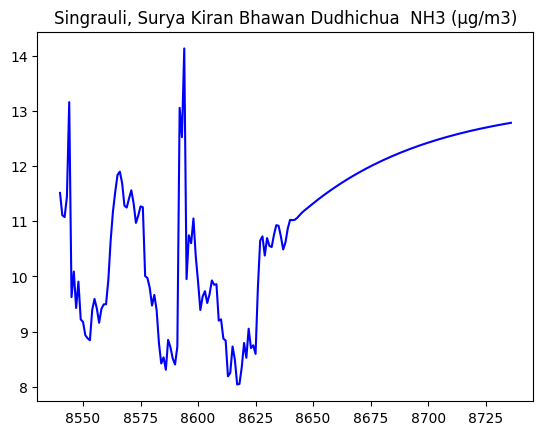

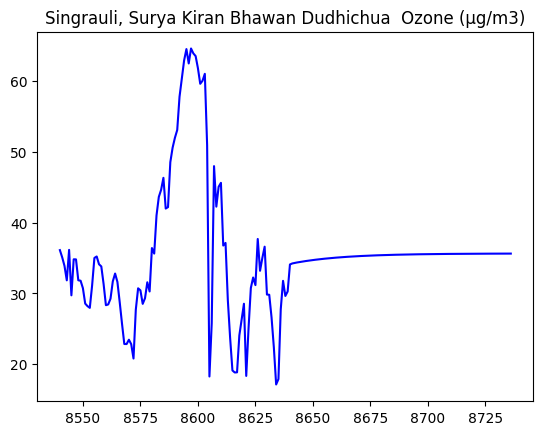

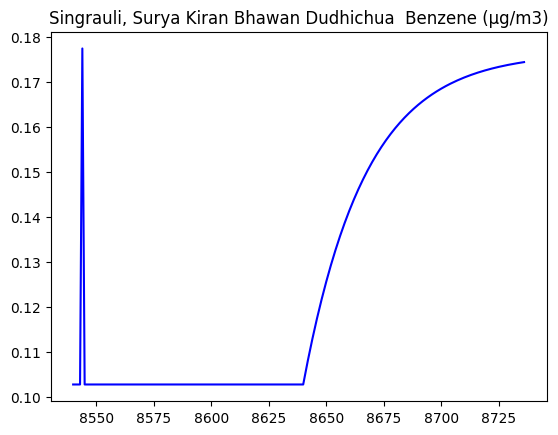

In [ ]:
i=0
for column in column_names[3:]:
    train_data=df[column]
    #test_data=df[column][-100:]
    ar_model=AutoReg(df2[column], lags=lags[i]).fit()
    #print(ar_model.summary())
    forecast = ar_model.predict(start = len(train_data)-100, end = len(df2) + 96, dynamic=False)
    plt.plot(forecast, color = "blue")
    #plt.plot(test_data, color = "red")
    plt.title(column)
    plt.show()
    i+=1

In [ ]:
for column in column_names2[3:]:
  diffs=np.diff(df2[column])
  sum_diffs=np.sum(diffs)
  if sum_diffs > 0:
      classification = "Stock"
  else:
      classification = "Flow"

  print("Time series classification of "+column+": ", classification)

Time series classification of Singrauli, Surya Kiran Bhawan Dudhichua  PM10 (µg/m3):  Flow
Time series classification of Singrauli, Surya Kiran Bhawan Dudhichua  PM2.5 (µg/m3):  Flow
Time series classification of Singrauli, Surya Kiran Bhawan Dudhichua  NO (µg/m3):  Stock
Time series classification of Singrauli, Surya Kiran Bhawan Dudhichua  NO2 (µg/m3):  Stock
Time series classification of Singrauli, Surya Kiran Bhawan Dudhichua  NOX (ppb):  Stock
Time series classification of Singrauli, Surya Kiran Bhawan Dudhichua  CO (mg/m3):  Stock
Time series classification of Singrauli, Surya Kiran Bhawan Dudhichua  SO2 (µg/m3):  Stock
Time series classification of Singrauli, Surya Kiran Bhawan Dudhichua  NH3 (µg/m3):  Flow
Time series classification of Singrauli, Surya Kiran Bhawan Dudhichua  Ozone (µg/m3):  Stock
Time series classification of Singrauli, Surya Kiran Bhawan Dudhichua  Benzene (µg/m3):  Flow
